In [1]:
import cv2
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
import os
from tqdm import tqdm
from scipy import stats
from scipy.stats import skew, kurtosis
from scipy.stats import norm as normal_distr
from scipy.stats import poisson, gamma

from sklearn.mixture import GaussianMixture

from src.lib import *

сделать:
- исследование шума на снимках dwell фон и не фон, посмотреть, что по параметрами, занести их в табличку
- проанализировать параметры
- посмотреть, какое распределение
- исследование на снимках inegration
- записать все параметры
 

In [2]:
# /home/sasha/WSLProjects/metrics/input_data/2023-09-25

# /home/sasha/WSLProjects/metrics/noise_characteristics.xlsx

In [10]:
path_to_dir_big = "/home/sasha/WSLProjects/metrics/input_data/2023-09-25/test_img"
path_to_dir_denoised = "./data"
dwell_dir = path_to_dir_big + '/Dwell-time'
inegration_dir = path_to_dir_big + '/Inegration'

filenames_dwell = os.listdir(dwell_dir)
filenames_inegration = os.listdir(inegration_dir)

filenames_dwell.sort()
filenames_inegration.sort()

dwell_b2u_dir = path_to_dir_denoised + '/blind2unblind_dwell/blind2unblind'
dwell_scunet_dir = path_to_dir_denoised + '/scunet_gray_50_dwell/scunet_gray_50'
dwell_neat_dir = path_to_dir_denoised + '/neat_image_dwell'


inegration_b2u_dir = path_to_dir_denoised + '/blind2unblind_inegration/blind2unblind'
inegration_scunet_dir = path_to_dir_denoised + '/scunet_gray_50_inegration/scunet_gray_50'
inegration_neat_dir = path_to_dir_denoised + '/neat_image_inegration'



filenames_dwell_b2u = os.listdir(dwell_b2u_dir)
filenames_dwell_scunet = os.listdir(dwell_scunet_dir)
filenames_dwell_neat = os.listdir(dwell_neat_dir)


filenames_inegration_b2u = os.listdir(inegration_b2u_dir)
filenames_inegration_scunet = os.listdir(inegration_scunet_dir)
filenames_inegration_neat = os.listdir(inegration_neat_dir)



filenames_dwell_b2u.sort()
filenames_dwell_scunet.sort()
filenames_inegration_b2u.sort()
filenames_inegration_scunet.sort()
filenames_dwell_neat.sort()
filenames_inegration_neat.sort()

df_noise_char = pd.read_excel('./noise_characteristic_dwell_inegration.xlsx', )
# df_noise_char = df_noise_char.drop(columns = ['brightness name', 'noise intensity'])

Занесение всех характеристик в таблицу

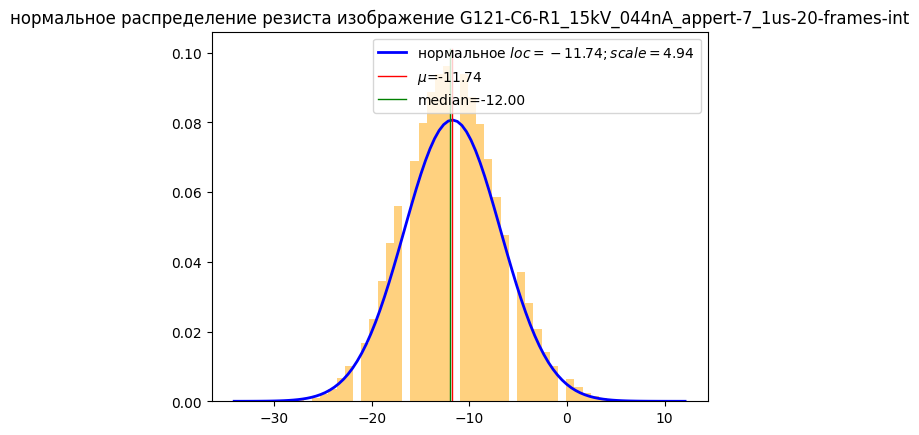

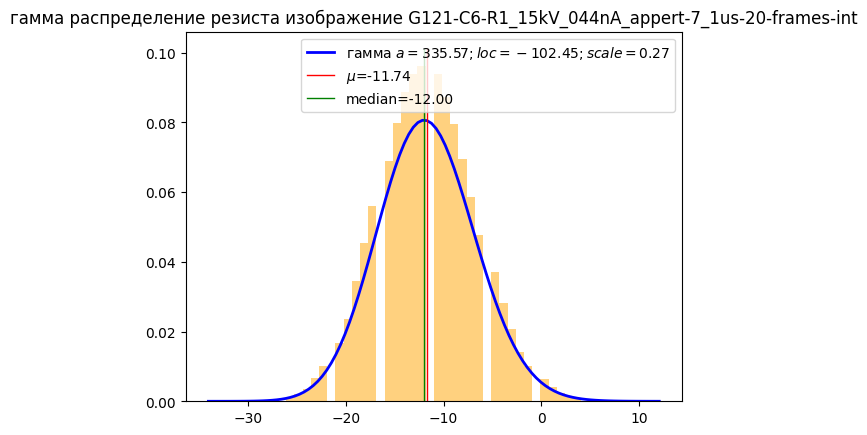

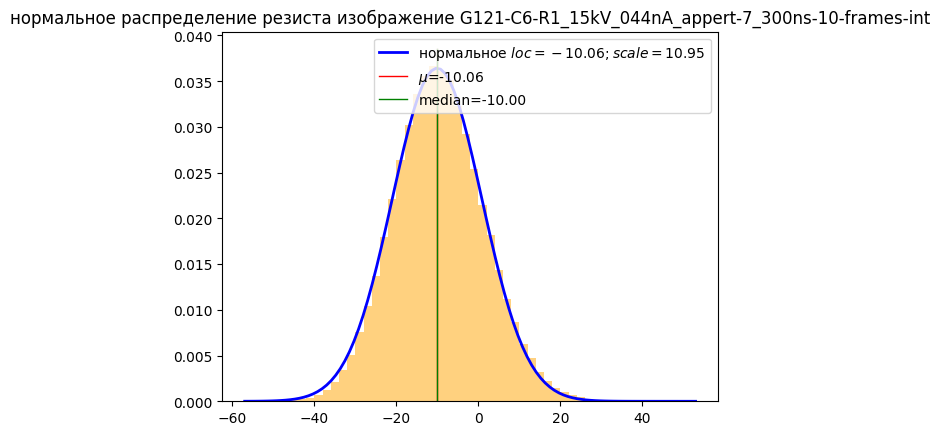

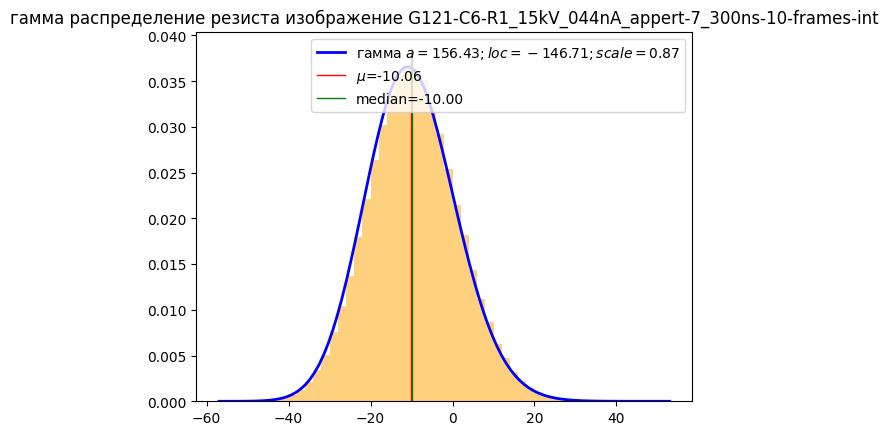

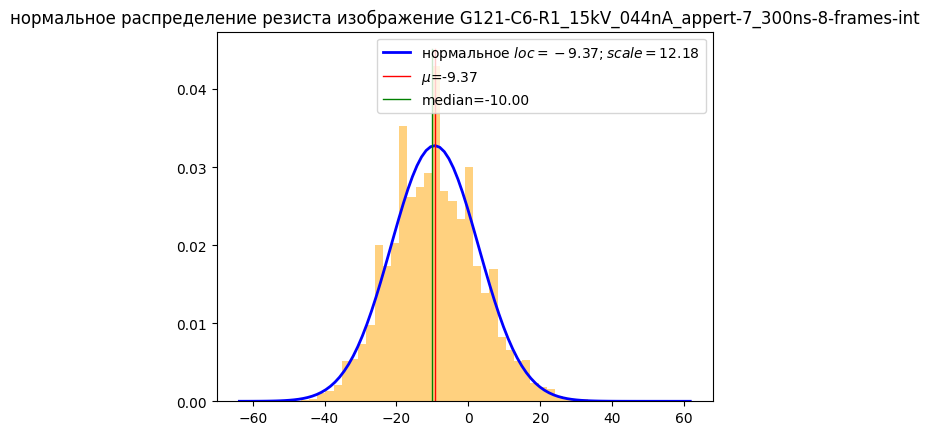

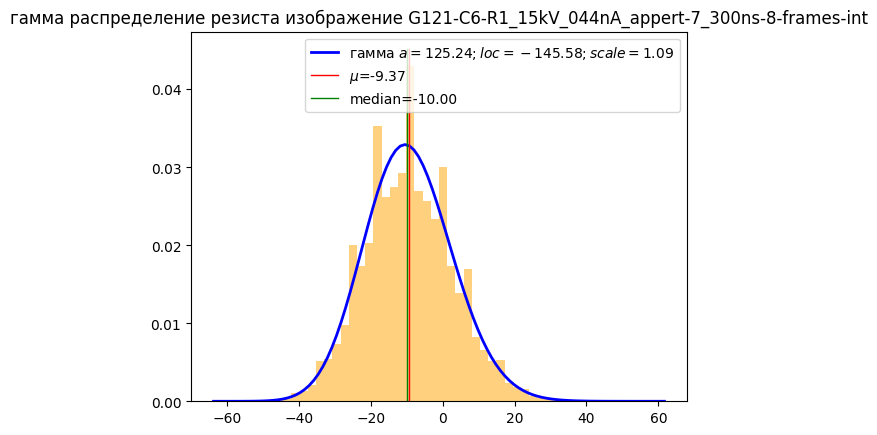

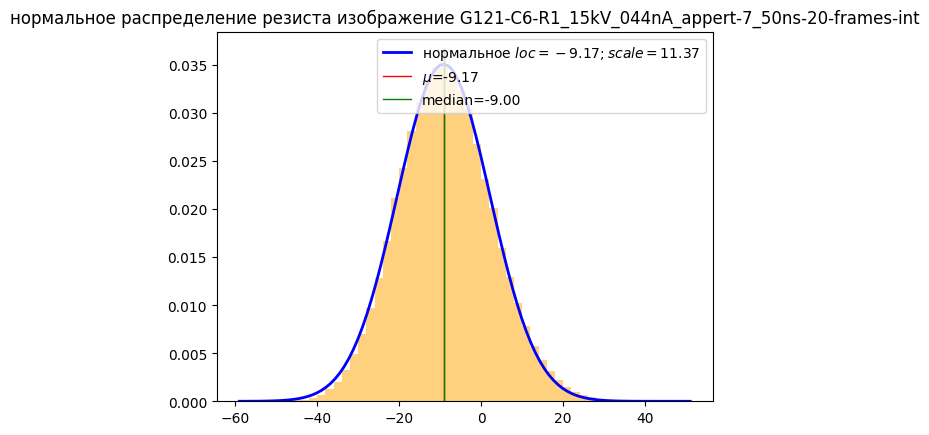

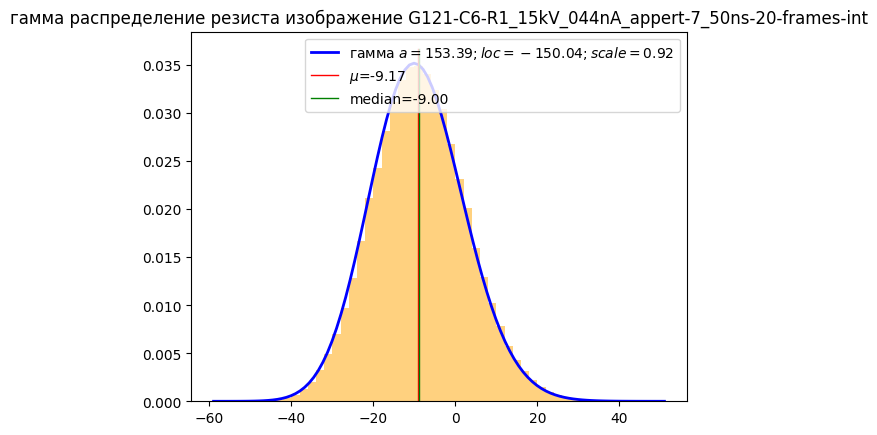

In [124]:
dataset = 'inegration'

if dataset == 'dwell':
    files = filenames_dwell
    dir = dwell_dir
elif dataset == 'inegration':
    files = filenames_inegration
    dir = inegration_dir


for i in range(len(files)):

    name = files[i]
    img_raw = cv2.imread(os.path.join(dir, name),0).astype(np.float32)
    img_raw = img_raw[:4096,:]
    mode = stats.mode(img_raw.ravel())[0]
    noise = img_raw - mode
    img_raw_phr = img_raw[1400:1900:,2700:3200]
    noise_phr_crop = img_raw_phr - mode

    params_norm_phr_crop = check_distr(noise_phr_crop, 'norm', 'PhR', name[:-4], color='orange', bins=50)
    params_gamma_phr_crop = check_distr(noise_phr_crop, 'gamma', 'PhR', name[:-4], color='orange', bins=50)

    contrast = calc_contrast(img_raw)
    dif_distr = dif_distr_gamma(noise_phr_crop, params_gamma_phr_crop)
    # std_phr = np.round(img_raw_phr.std(), 4)
    std_phr = np.round(noise_phr_crop.std(), 4)


    length = len(df_noise_char)

    df_noise_char.loc[length] = [f'2023-09-25 {dataset}', name[:-4], img_raw.shape, \
                np.round(np.mean(img_raw), 4), np.round(img_raw.std(), 4), \
                np.round(params_gamma_phr_crop[0], 4), np.round(params_gamma_phr_crop[1], 4), \
                np.round(params_gamma_phr_crop[2], 4), np.round(calc_brightness(img_raw), 4), \
                np.round(calc_psnr(img_raw_phr, noise_phr_crop), 4), \
                np.round(calc_mse(img_raw_phr, noise_phr_crop), 4),\
                    contrast, dif_distr, std_phr, np.round(np.mean(noise_phr_crop), 4)]
    



In [125]:
df_noise_char['brightness name'] = df_noise_char['brightness'].apply(interpret_bright)
df_noise_char['noise intensity'] = df_noise_char['psnr'].apply(interpret_psnr)

df_noise_char.to_excel('noise_characteristic_dwell_inegration.xlsx', index=False)

In [128]:
df_noise_char[24:25]

,name dataset,name img,shape,mean img,std img,a gamma,loc gamma,scale gamma,brightness,psnr,mse,contrast img,difference gamma,std PhR,mean PhR,brightness name,noise intensity
24,2023-09-25 dwell,G121-C6-R1_15kV_044nA_appert-7_1us-one-frame,"(4096, 6144)",85.009399,26.0378,51.2085,-148.2201,2.7286,85.009399,21.57,452.984802,1.0,21.9396,19.5289,-8.4622,темное,средний уровень шума


## Dwell-time

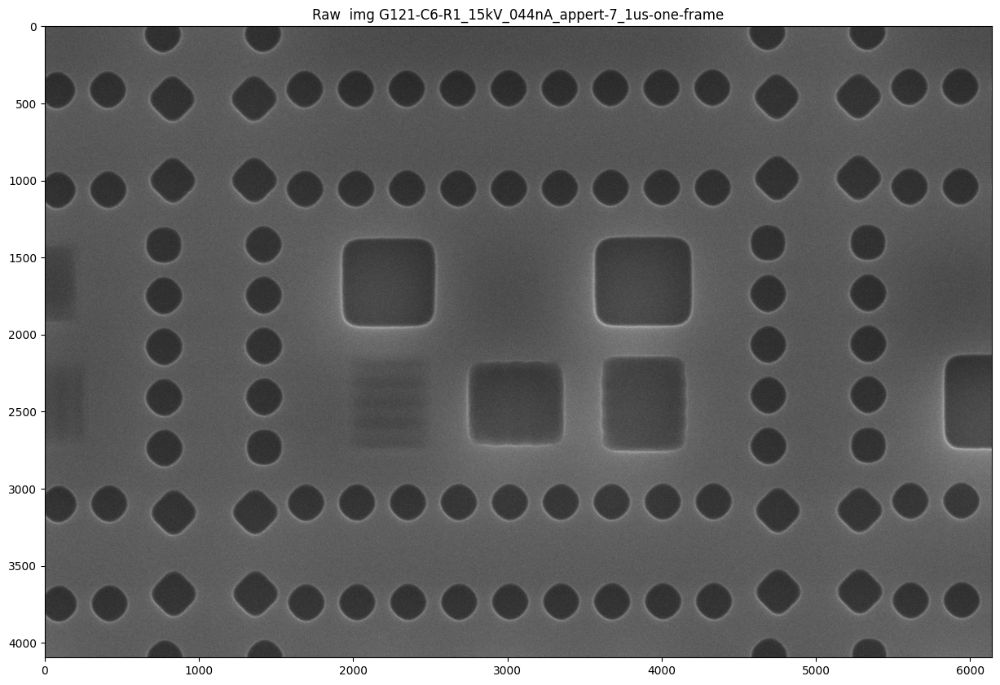

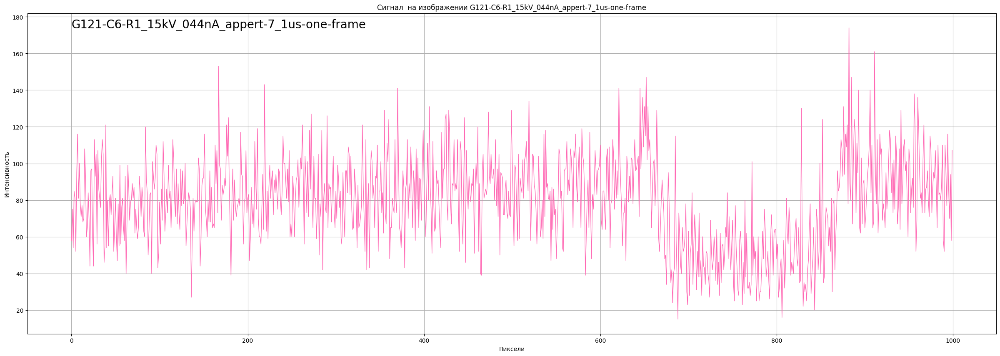

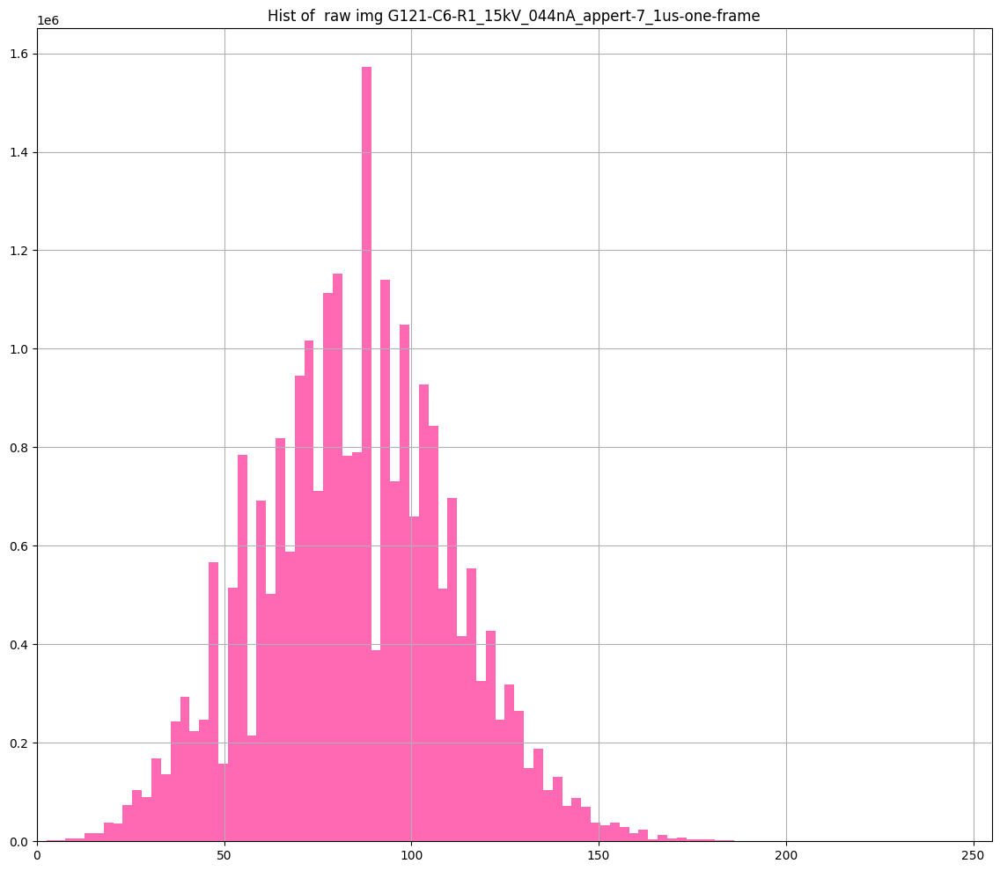

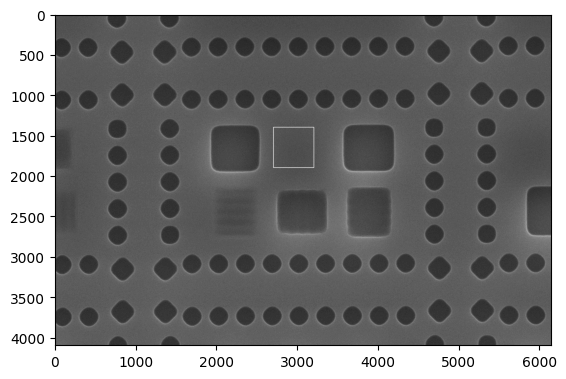

In [3]:
index = 0
name = filenames_dwell[index]
img_raw_dwell_1 = cv2.imread(os.path.join(dwell_dir, name),0).astype(np.float32)

img_raw_dwell_1 = img_raw_dwell_1[:4096,:]

show_imgs(img_raw_dwell_1, None, None, name[:-4], '')

plot_rawden_signals(img_raw_dwell_1, None, name[:-4], '', color='hotpink')

plot_hists(img_raw_dwell_1, None, None, 100, name[:-4], '', color='hotpink')

mode_dwell = stats.mode(img_raw_dwell_1.ravel())[0]
noise_dwell = img_raw_dwell_1 - mode_dwell

img = img_raw_dwell_1.copy()
img = cv2.rectangle(img, (2700,1400), (3200, 1900), (255, 0, 0), thickness=5)
plt.imshow(img, cmap='gray')

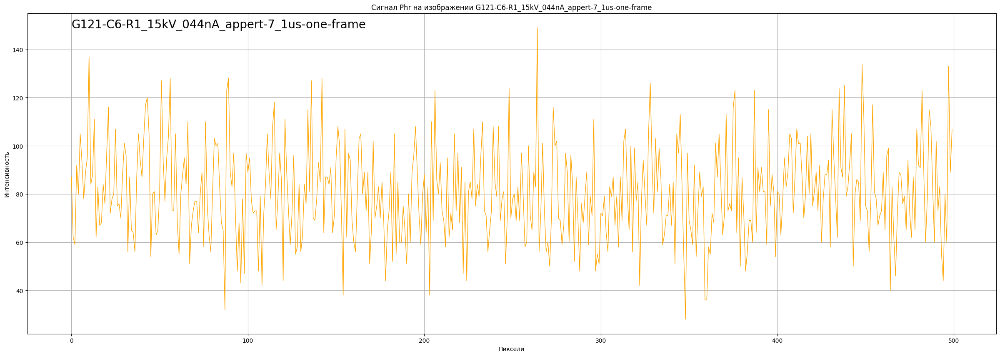

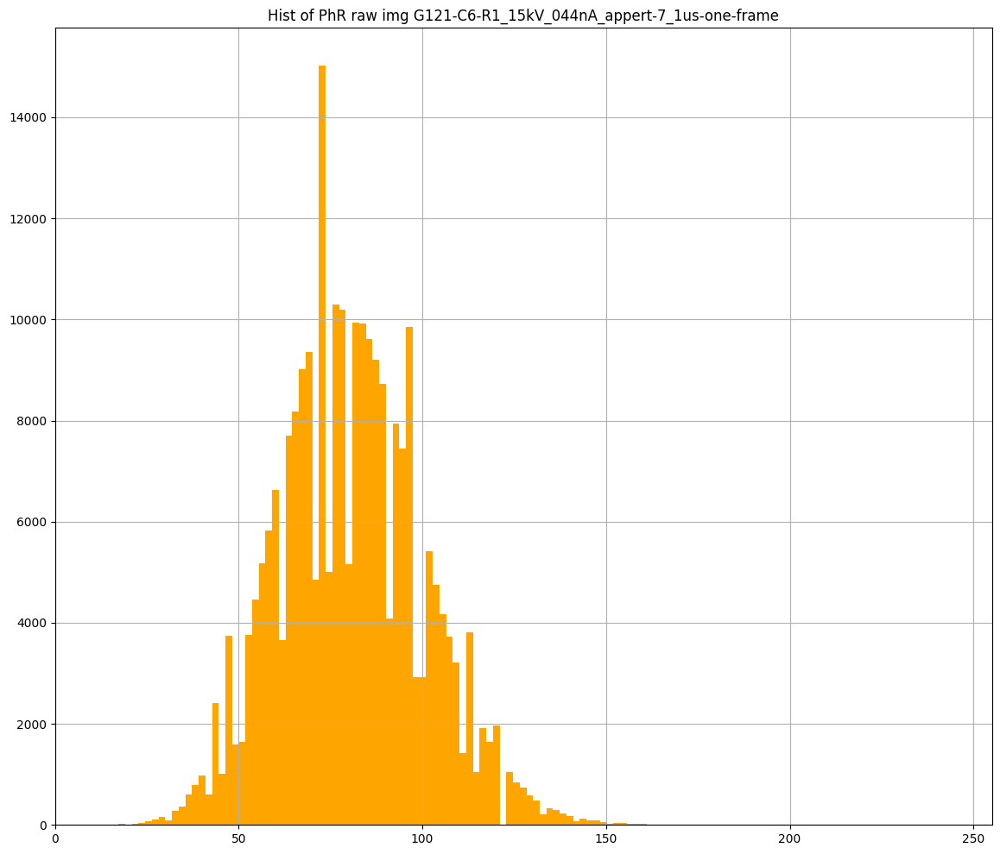

In [4]:
# # get si crop
# img_raw_dwell_si = img_raw_dwell[1400:1900:,2000:2500]
# print("Shape of Si crop: ", img_raw_dwell_si.shape)
# show_imgs(img_raw_dwell_si, None, None, name[:-4], '')

# # plot si signals
# plot_rawden_signals(img_raw_dwell_si, None, name[:-4], 'Si', color='red')
# plot_hists(img_raw_dwell_si, None, None, 100, name[:-4], 'Si', color='red')

# get phr crop
img_raw_dwell_phr_1 = img_raw_dwell_1[1400:1900:,2700:3200]
# print("Shape of PhR crop: ", img_raw_dwell_phr.shape)
# show_imgs(img_raw_dwell_phr, None, None, name[:-4], 'PhR')

# plot phr signals
plot_rawden_signals(img_raw_dwell_phr_1, None, name[:-4], 'Phr', color='orange')
plot_hists(img_raw_dwell_phr_1, None, None, 100, name[:-4], 'PhR', color='orange')
# noise_dwell_phr = img_raw_dwell_phr - mode_dwell
# clean_phr = img_raw_dwell_phr - noise_dwell_phr
# plot_hists(img_raw_dwell_phr, clean_phr, None, 100, name[:-4], 'PhR', color='orange')


# plot si and phr crop signals
# fig, ax = plt.subplots(1,1, figsize=(14, 12))

# # ax.hist(img_raw_dwell_si.ravel(), bins=100, alpha=0.5, color='red', label='только кремний')
# ax.hist(img_raw_dwell_phr.ravel(), alpha=0.5, color='orange', bins=100, label='только резист')
# plt.legend()
# plt.show()


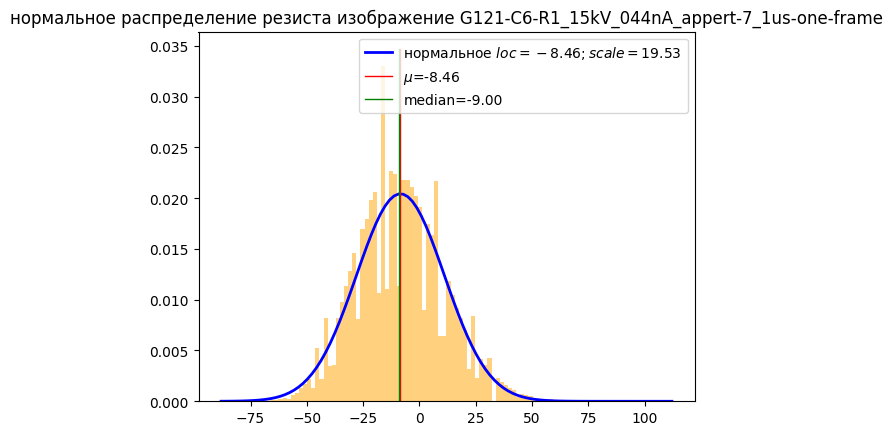

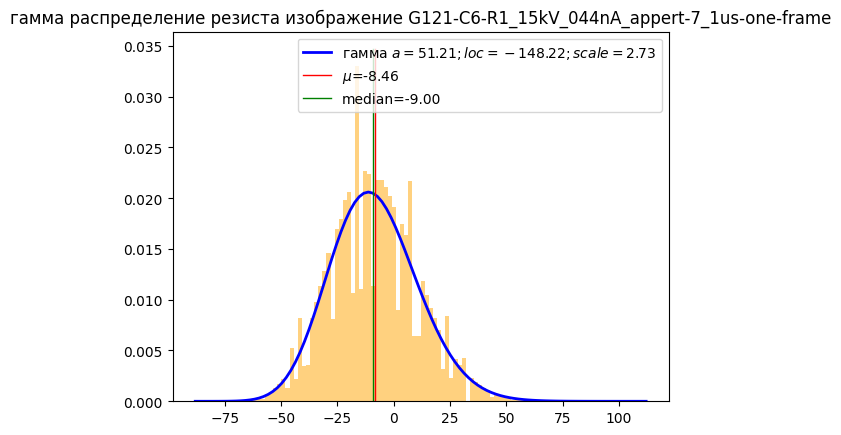

In [5]:
mode_dwell_1 = stats.mode(img_raw_dwell_1.ravel())[0]
# noise_si_crop = img_raw_dwell_si - mode_dwell
noise_phr_crop_1 = img_raw_dwell_phr_1 - mode_dwell_1


# params_norm_si_crop = check_distr(noise_si_crop, 'norm', 'Si', name[:-4], color='red', bins=50)
# params_gamma_si_crop = check_distr(noise_si_crop, 'gamma', 'Si', name[:-4], color='red', bins=50)

params_norm_phr_crop_1 = check_distr(noise_phr_crop_1, 'norm', 'PhR', name[:-4], color='orange', bins=100)
params_gamma_phr_crop_1 = check_distr(noise_phr_crop_1, 'gamma', 'PhR', name[:-4], color='orange', bins=100)

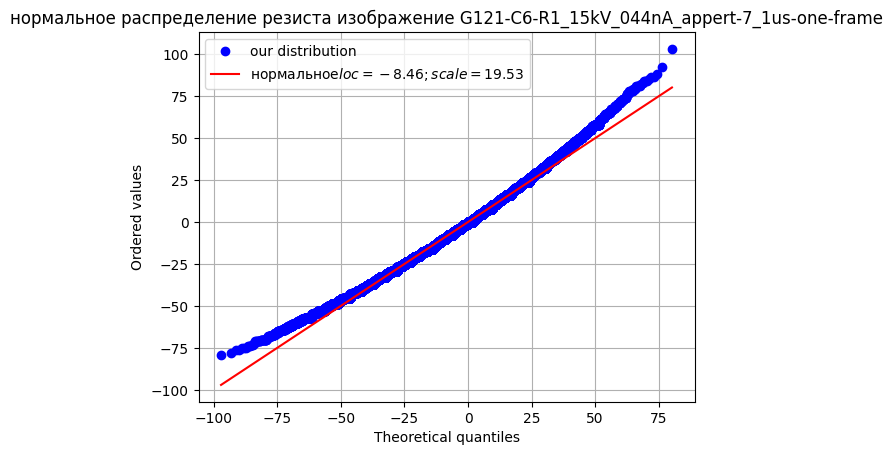

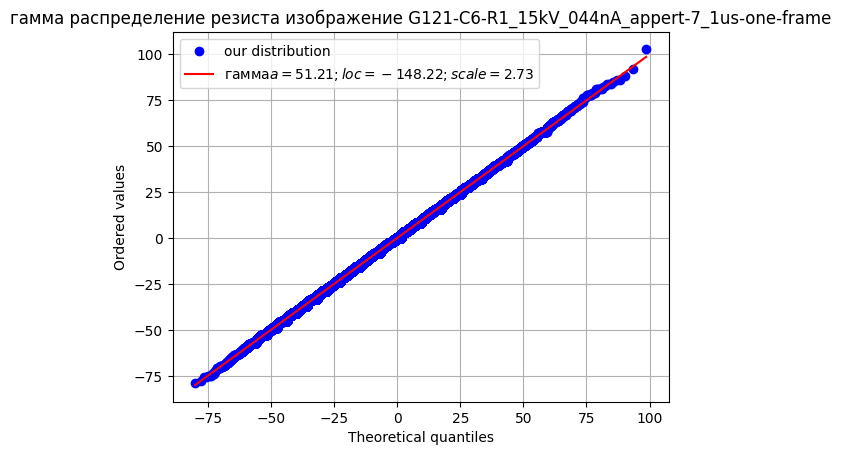

In [7]:
qq_plot(noise_phr_crop_1, name[:-4], 'PhR', 'norm', params_norm_phr_crop_1)
qq_plot(noise_phr_crop_1, name[:-4], 'PhR', 'gamma', params_gamma_phr_crop_1)

In [98]:
def simulate_noisy_img(original, clean, distr_name, *params):
    if distr_name == 'norm':
        distr = stats.norm
    elif distr_name == 'gamma':
        distr = stats.gamma

    # x = np.linspace(original.ravel().min(), original.ravel().max(), len(original.ravel()))
    x = np.linspace(original.ravel().min(), original.ravel().max(), len(original.ravel()))

    # distr_func = distr.pdf(x, *params)
    # print(x.shape)
    noise = distr.pdf(x, *params)
    noise = noise.reshape(original.shape[0], original.shape[1])
    print(noise * 255)

    # img_simulate = clean[:4096, :] + noise
    # img_simulate = cv2.addWeighted(clean,0.5,noise,0.5,0)
    plt.imshow((noise * 255).astype(np.uint8), cmap='gray')
    # print(noise == clean)
    plt.show()

    # print('ssim between simulate and clean: ', calculate_ssim(img_simulate, clean[:4096, :]))
    # print('ssim between raw and simulate: ', calculate_ssim(img_simulate, original[:4096, :]))


[[9.27956507e-01 9.27955959e-01 9.27955412e-01 ... 9.24599485e-01
  9.24598939e-01 9.24598393e-01]
 [9.24597847e-01 9.24597301e-01 9.24596756e-01 ... 9.21250038e-01
  9.21249494e-01 9.21248950e-01]
 [9.21248405e-01 9.21247861e-01 9.21247316e-01 ... 9.17909798e-01
  9.17909255e-01 9.17908712e-01]
 ...
 [3.03249824e-14 3.03249327e-14 3.03248831e-14 ... 3.00217523e-14
  3.00217031e-14 3.00216540e-14]
 [3.00216049e-14 3.00215557e-14 3.00215066e-14 ... 2.97213854e-14
  2.97213367e-14 2.97212881e-14]
 [2.97212395e-14 2.97211908e-14 2.97211422e-14 ... 2.94240009e-14
  2.94239528e-14 2.94239046e-14]]


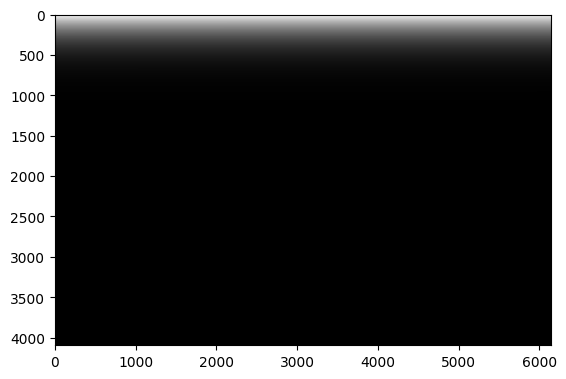

In [99]:
dataset = 'inegration'
if dataset == 'dwell':
    files_raw = filenames_dwell
    files_b2u = filenames_dwell_b2u
    files_scunet = filenames_dwell_scunet
    files_neat = filenames_dwell_neat
    dir_raw = dwell_dir
    dir_b2u = dwell_b2u_dir
    dir_scunet = dwell_scunet_dir
    dir_neat = dwell_neat_dir


elif dataset == 'inegration':
    files_raw = filenames_inegration
    files_b2u = filenames_inegration_b2u
    files_scunet = filenames_inegration_scunet
    files_neat = filenames_inegration_neat

    dir_raw = inegration_dir
    dir_b2u = inegration_b2u_dir
    dir_scunet = inegration_scunet_dir
    dir_neat = inegration_neat_dir


# length = len(df_metrics)
count = 0
for i, j, k, l in zip(files_b2u, files_scunet, files_raw, files_neat):
    if count == 1:
        break
    img_scunet = cv2.imread(os.path.join(dir_scunet, j), 0)
    img_raw = cv2.imread(os.path.join(dir_raw, k), 0)

    # mode = stats.mode(img_raw.ravel())[0]
    # noise = img_raw - mode
    
    
    simulate_noisy_img(img_raw[:4096, :], img_scunet, 'gamma', *params_gamma_phr_crop_1)
    count += 1

In [ ]:
clean = cv2.imread(os.path.join(dir_scunet, filenames_dwell_scunet[0]), 0)

In [ ]:
df_p_values = pd.DataFrame(columns=['image', 'slice y', 'shapiro p value norm', 'anderson p value norm', \
                                    'kolmogorov p value gamma', 'kolmogorov p value norm', 'result anderson', 'result kolmogorov gamma', \
                                        'result kolmogorov norm'])
df_p_values

,image,slice y,shapiro p value norm,anderson p value norm,kolmogorov p value gamma,kolmogorov p value norm,result anderson,result kolmogorov gamma,result kolmogorov norm


In [10]:
from scipy.stats import shapiro
y = 0
for i in range(9):
    y = y + 50
    data = noise_phr_crop_1[y, :]
    _, p_value_shapiro = np.round(shapiro(data), 4)
    result = stats.anderson(data)
    p_value_anderson = np.round(result.statistic, 4)

    if result.statistic > result.critical_values[-1]:
        res_anderson = "не нормальное"
    else:
       res_anderson = "нормальное"


    kstest_result_gamma = stats.kstest(data, 'gamma', args=(params_gamma_phr_crop_1[0], params_gamma_phr_crop_1[2]))
    p_value_kolomogorov_gamma = np.round(kstest_result_gamma.pvalue, 4)
    print(p_value_kolomogorov_gamma)

    kstest_result_norm = stats.kstest(data, 'norm', args=(params_norm_phr_crop_1[0], params_norm_phr_crop_1[1]))
    p_value_kolomogorov_norm = np.round(kstest_result_norm.pvalue, 4)
    print(p_value_kolomogorov_norm)

    if kstest_result_gamma.pvalue > 0.05:
        res_kolm_gamma = "гамма"
    else:
        res_kolm_gamma = "не гамма"
    
    if kstest_result_norm.pvalue > 0.05:
        res_kolm_norm = "нормальное"
    else:
        res_kolm_norm = "не нормальное"

    df_p_values.loc[i] = [name[:-4], y, p_value_shapiro, p_value_anderson, p_value_kolomogorov_gamma, \
                          p_value_kolomogorov_norm, res_anderson, res_kolm_gamma, res_kolm_norm]

0.0
0.1117


NameError: name 'df_p_values' is not defined

In [53]:
df_p_values

,image,slice y,shapiro p value norm,anderson p value norm,kolmogorov p value gamma,kolmogorov p value norm,result anderson,result kolmogorov gamma,result kolmogorov norm
0,G121-C6-R1_15kV_044nA_appert-7_1us-one-frame,50,0.5865,0.4404,0.0,0.1117,нормальное,не гамма,нормальное
1,G121-C6-R1_15kV_044nA_appert-7_1us-one-frame,100,0.0110,1.1423,0.0,0.0635,не нормальное,не гамма,нормальное
2,G121-C6-R1_15kV_044nA_appert-7_1us-one-frame,150,0.2715,0.3839,0.0,0.2306,нормальное,не гамма,нормальное
3,G121-C6-R1_15kV_044nA_appert-7_1us-one-frame,200,0.2665,0.4350,0.0,0.0390,нормальное,не гамма,не нормальное
4,G121-C6-R1_15kV_044nA_appert-7_1us-one-frame,250,0.2704,0.6809,0.0,0.0003,нормальное,не гамма,не нормальное
5,G121-C6-R1_15kV_044nA_appert-7_1us-one-frame,300,0.0001,1.5530,0.0,0.0000,не нормальное,не гамма,не нормальное
6,G121-C6-R1_15kV_044nA_appert-7_1us-one-frame,350,0.0027,0.5167,0.0,0.4361,нормальное,не гамма,нормальное
7,G121-C6-R1_15kV_044nA_appert-7_1us-one-frame,400,0.0918,0.5361,0.0,0.5043,нормальное,не гамма,нормальное
8,G121-C6-R1_15kV_044nA_appert-7_1us-one-frame,450,0.0245,0.9405,0.0,0.3733,нормальное,не гамма,нормальное


In [32]:
# data = noise_phr_crop_1[200, :]
data  = noise_phr_crop_1

In [31]:
from scipy.stats import ks_2samp

# distr = stats.norm
distr = stats.gamma


x = np.linspace(data.ravel().min(), data.ravel().max(), len(data))

data_norm = distr.pdf(x, params_norm_phr_crop_1[0], params_norm_phr_crop_1[1])
data_gamma = distr.pdf(x, params_gamma_phr_crop_1[0], params_gamma_phr_crop_1[2])
# _, p_value = ks_2samp(data.ravel(), data_norm)
_, p_value = ks_2samp(data.ravel(), data_gamma)

p_value

5.59201270688874e-95

In [33]:
from scipy.stats import norm
from scipy.optimize import minimize

def negative_log_likelihood(params, data):
    mean, std_dev = params
    log_likelihood = np.sum(norm.logpdf(data, loc=mean, scale=std_dev))
    return -log_likelihood  # Максимизируем, поэтому берем обратное значение

# Начальные предположения для параметров (среднего и стандартного отклонения)
initial_guess = [np.mean(data), np.std(data)]

# Минимизация отрицательного логарифма правдоподобия для оценки параметров
result = minimize(negative_log_likelihood, initial_guess, args=(data,))
estimated_mean, estimated_std_dev = result.x

print("Оцененное среднее:", estimated_mean)
print("Оцененное стандартное отклонение:", estimated_std_dev)

Оцененное среднее: -8.46216
Оцененное стандартное отклонение: 19.528866


In [41]:
# Решение для α из уравнения для среднеквадратического отклонения
alpha = (estimated_mean / estimated_std_dev)**2

# Решение для β из уравнения для среднего
beta = estimated_mean / alpha

loc = estimated_mean - alpha*beta

print("Параметр формы α:", alpha)
print("Параметр масштаба β:", beta)
print("Параметр cдвига loc:", loc)

Параметр формы α: 0.18776231016117695
Параметр масштаба β: -45.06847036132882
Параметр cдвига loc: 0.0


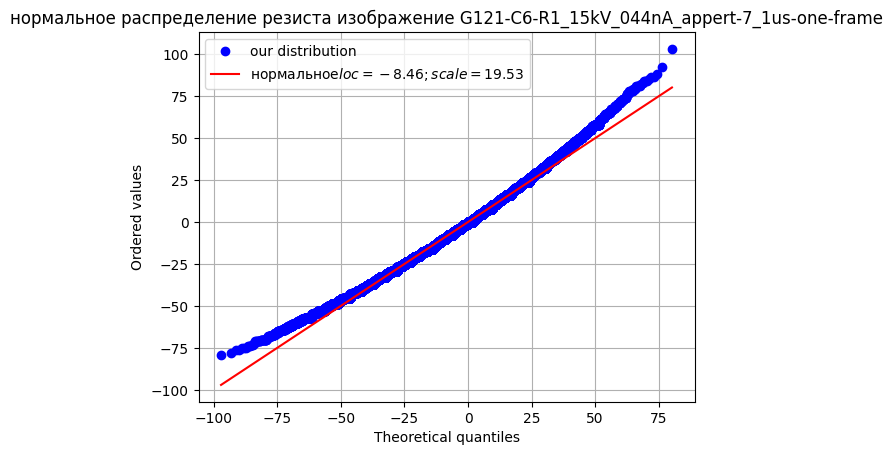

In [40]:
qq_plot(noise_phr_crop_1, name[:-4], 'PhR', 'norm', (estimated_mean, estimated_std_dev))

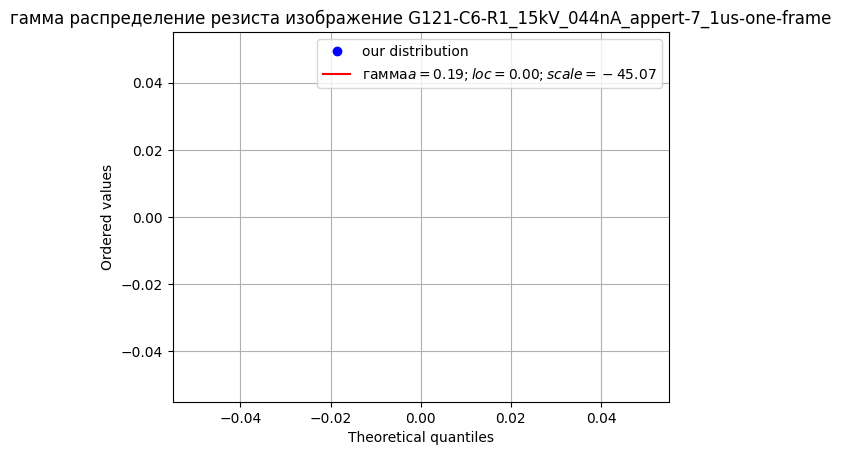

In [42]:
qq_plot(noise_phr_crop_1, name[:-4], 'PhR', 'gamma', (alpha, loc, beta))

In [41]:
result = stats.anderson(data, dist='norm')
result

AndersonResult(statistic=0.4350177918735767, critical_values=array([0.571, 0.651, 0.781, 0.911, 1.083]), significance_level=array([15. , 10. ,  5. ,  2.5,  1. ]), fit_result=  params: FitParams(loc=-9.736, scale=18.849108)
 success: True
 message: '`anderson` successfully fit the distribution to the data.')

In [31]:
kstest_result = stats.kstest(data, 'norm', args=(params_norm_phr_crop_1[0], params_norm_phr_crop_1[1]))
kstest_result

KstestResult(statistic=0.06239279473923087, pvalue=0.03904669557024354, statistic_location=0.0, statistic_sign=1)

In [46]:
df_p_values

,image,slice y,shapiro p value norm,anderson p value norm,kolmogorov p value gamma,result anderson,result kolmogorov
0,G121-C6-R1_15kV_044nA_appert-7_1us-one-frame,100,0.0110,1.1423,0.0,не нормальное,не гамма
1,G121-C6-R1_15kV_044nA_appert-7_1us-one-frame,200,0.2665,0.4350,0.0,нормальное,не гамма
2,G121-C6-R1_15kV_044nA_appert-7_1us-one-frame,300,0.0001,1.5530,0.0,не нормальное,не гамма
3,G121-C6-R1_15kV_044nA_appert-7_1us-one-frame,400,0.0918,0.5361,0.0,нормальное,не гамма


In [47]:
from scipy.stats import shapiro
y = 300
data = noise_phr_crop[y, :]
_, p_value = shapiro(data)

if p_value > 0.05:
    print(f'Изображение {name}\nСрез y = {y}\np value = {p_value}\nДанные можно считать нормально распределенными')
else:
    print(f'Изображение {name}\nСрез y = {y}\np value = {p_value}\nДанные нельзя считать нормально распределенными')

Изображение G121-C6-R1_15kV_044nA_appert-7_1us-one-frame.tif
Срез y = 300
p value = 6.428877532016486e-05
Данные нельзя считать нормально распределенными


In [41]:
# plt.imshow(noise_phr_crop[300:400, :])

In [42]:
# Тест Андерсона-Дарлинга
result = stats.anderson(data)

print(f'Изображение {name}\nСрез y = {y}')
print(f"Статистика теста: {result.statistic}")
print("Критические значения:")
for i, crit_val in enumerate(result.critical_values):
    print(f"Уровень значимости {result.significance_level[i]}%: {crit_val}")

# Интерпретация результатов
if result.statistic > result.critical_values[-1]:
    print("Данные не похожи на нормальное распределение (отвергаем нулевую гипотезу)")
else:
    print("Данные похожи на нормальное распределение (не отвергаем нулевую гипотезу)")

Изображение G121-C6-R1_15kV_044nA_appert-7_1us-one-frame.tif
Срез y = 400
Статистика теста: 0.5360865509621817
Критические значения:
Уровень значимости 15.0%: 0.571
Уровень значимости 10.0%: 0.651
Уровень значимости 5.0%: 0.781
Уровень значимости 2.5%: 0.911
Уровень значимости 1.0%: 1.083
Данные похожи на нормальное распределение (не отвергаем нулевую гипотезу)


In [48]:

kstest_result = stats.kstest(data, 'gamma', args=(params_gamma_phr_crop[0], params_gamma_phr_crop[2]))

print(f'Изображение {name}\nСрез y = {y}')
print(f"Статистика теста: {kstest_result.statistic}")
print(f"p-value: {kstest_result.pvalue}")

# Интерпретация результатов
alpha = 0.05
if kstest_result.pvalue > alpha:
    print("Данные похожи на гамма-распределение")
else:
    print("Данные не похожи на гамма-распределение")

Изображение G121-C6-R1_15kV_044nA_appert-7_1us-one-frame.tif
Срез y = 300
Статистика теста: 0.977679089254651
p-value: 0.0
Данные не похожи на гамма-распределение


для резиста больше подходит гамма распределение

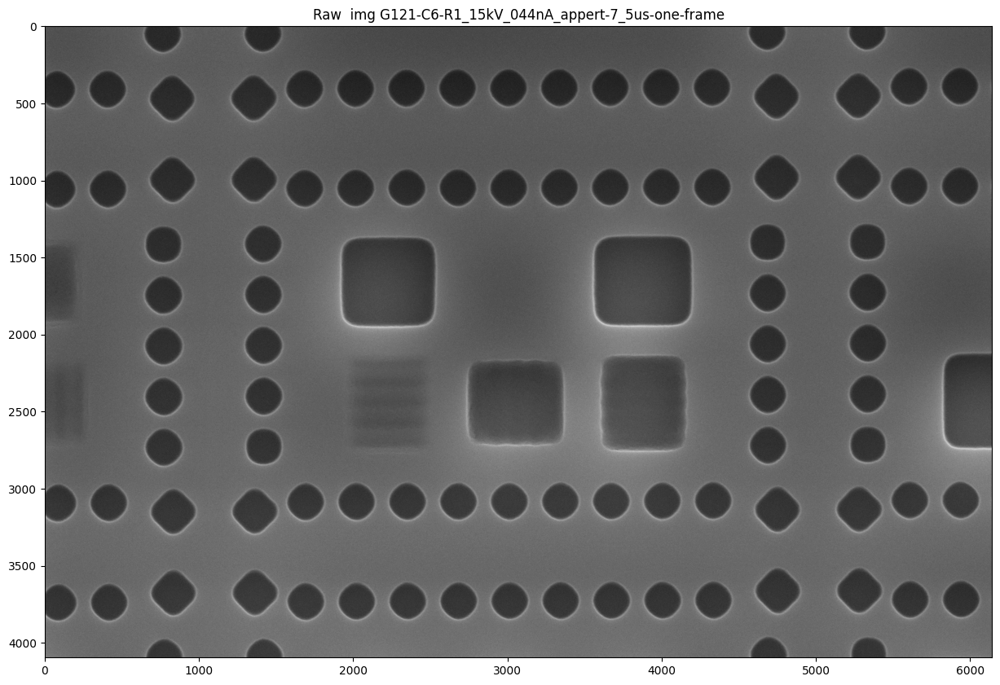

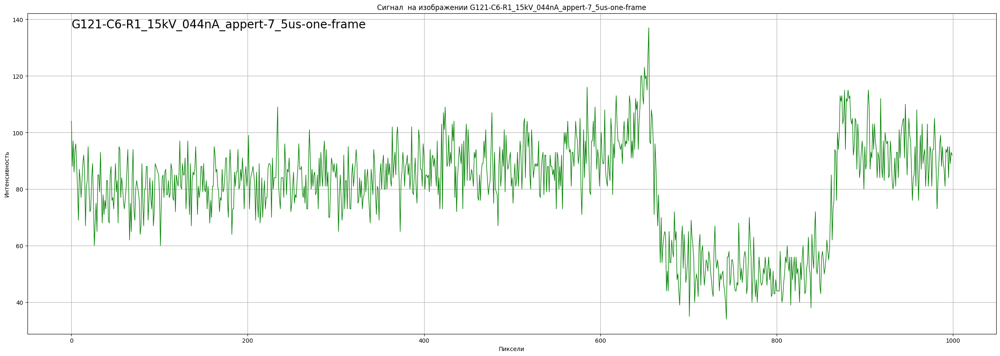

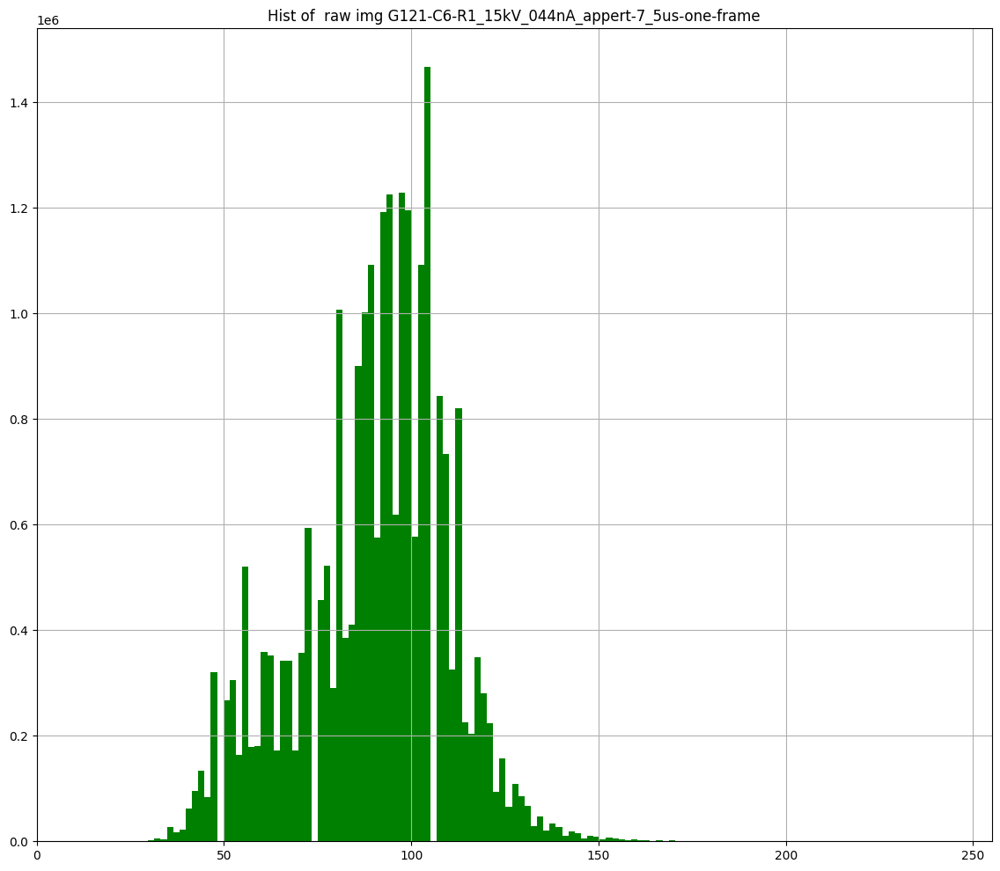

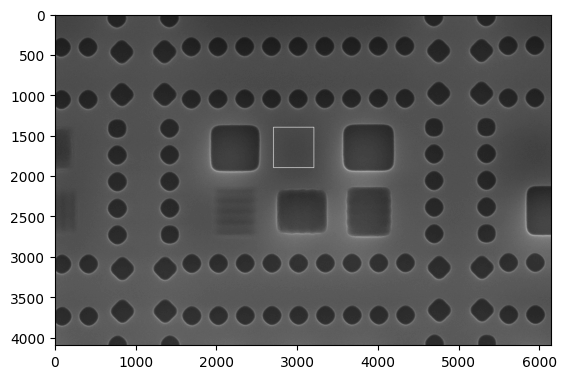

In [49]:
index = 4
name = filenames_dwell[index]
img_raw_dwell_5 = cv2.imread(os.path.join(dwell_dir, name),0).astype(np.float32)

img_raw_dwell_5 = img_raw_dwell_5[:4096,:]

show_imgs(img_raw_dwell_5, None, None, name[:-4], '')

plot_rawden_signals(img_raw_dwell_5, None, name[:-4], '', color='green')

plot_hists(img_raw_dwell_5, None, None, 120, name[:-4], '', color='green')

mode_dwell_5 = stats.mode(img_raw_dwell_5.ravel())[0]
noise_dwell_5 = img_raw_dwell_5 - mode_dwell_5

img = img_raw_dwell_5.copy()
img = cv2.rectangle(img, (2700,1400), (3200, 1900), (255, 0, 0), thickness=5)
plt.imshow(img, cmap='gray')

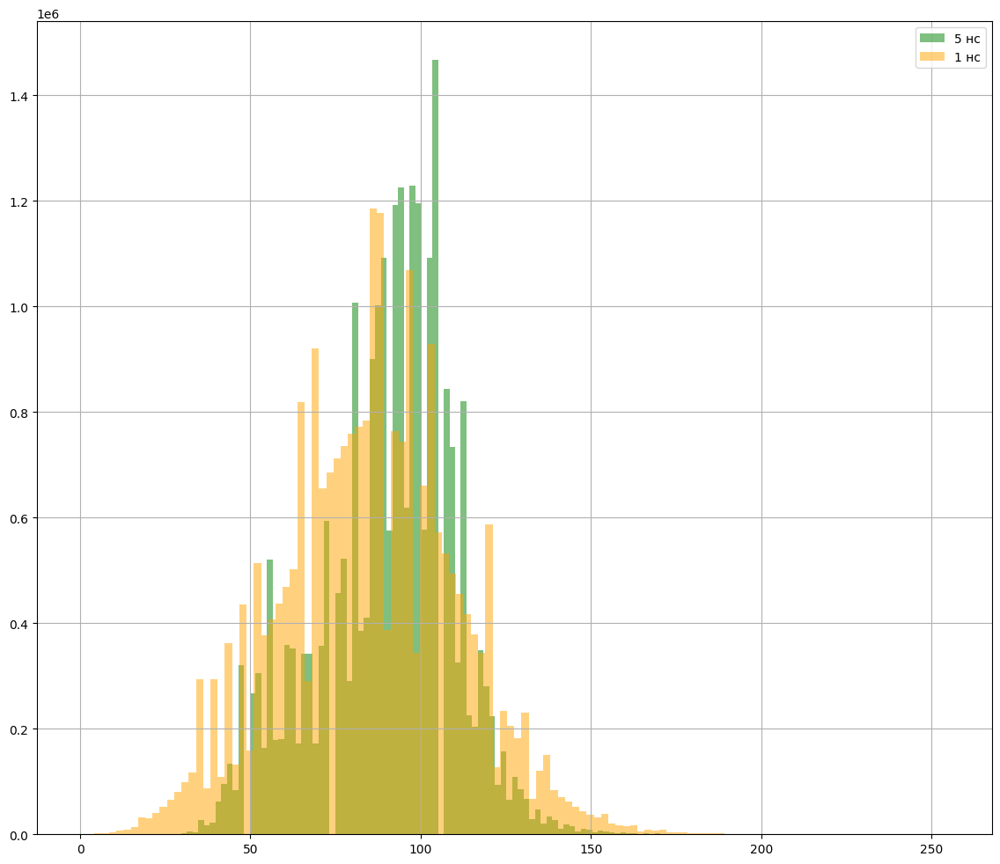

In [50]:
fig, ax = plt.subplots(1,1, figsize=(14, 12))

ax.hist(img_raw_dwell_5.ravel(), alpha=0.5, color='green', bins=120, label='5 нс')
ax.hist(img_raw_dwell.ravel(), bins=120, alpha=0.5, color='orange', label='1 нс')
plt.grid()
plt.legend()
plt.show()

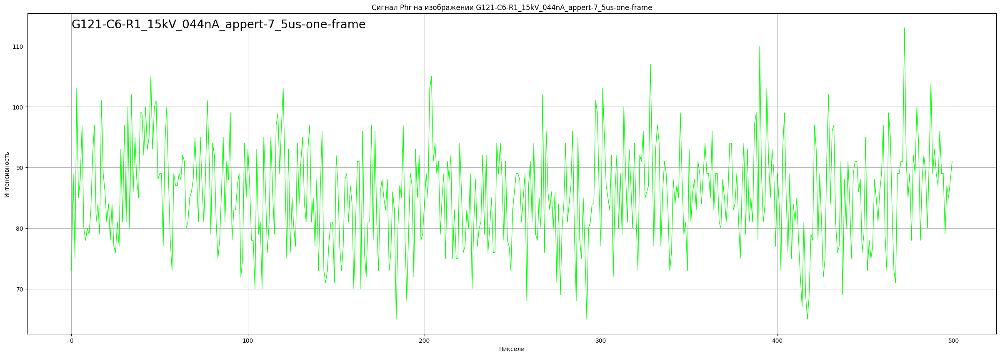

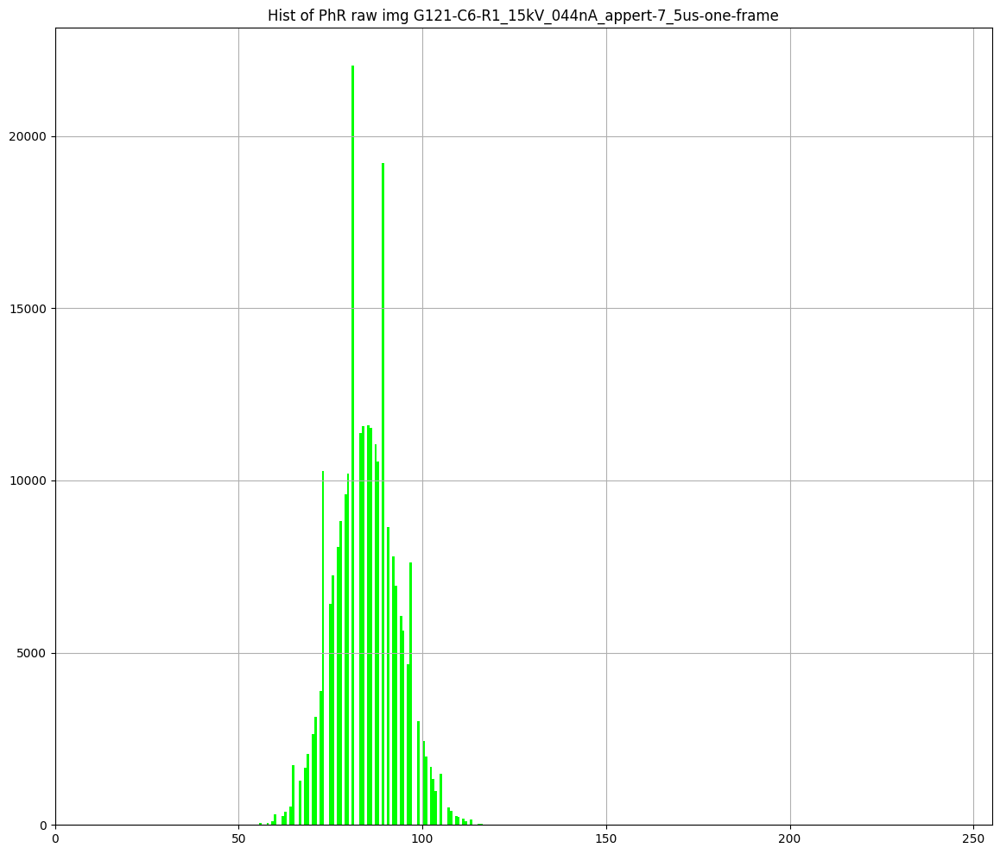

In [51]:
img_raw_dwell_phr_5 = img_raw_dwell_5[1400:1900:,2700:3200]
# print("Shape of PhR crop: ", img_raw_dwell_phr.shape)
# show_imgs(img_raw_dwell_phr, None, None, name[:-4], 'PhR')

# plot phr signals
plot_rawden_signals(img_raw_dwell_phr_5, None, name[:-4], 'Phr', color='lime')
plot_hists(img_raw_dwell_phr_5, None, None, 120, name[:-4], 'PhR', color='lime')

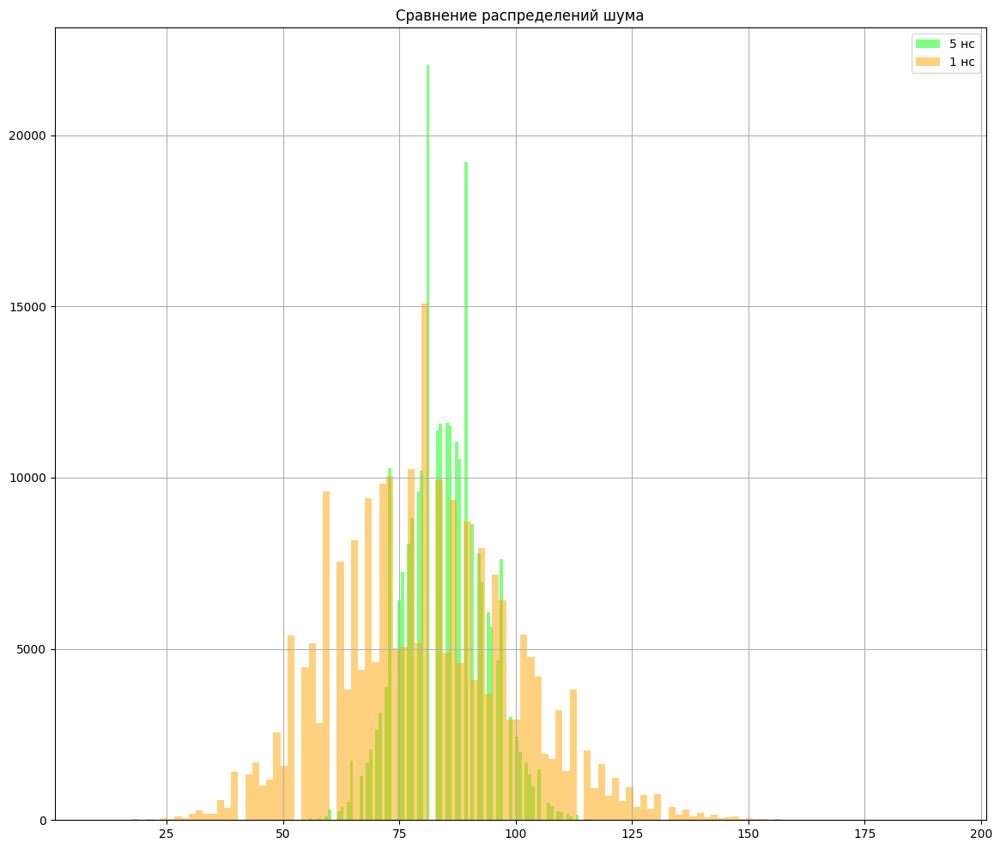

In [52]:
fig, ax = plt.subplots(1,1, figsize=(14, 12))

ax.hist(img_raw_dwell_phr_5.ravel(), alpha=0.5, color='lime', bins=120, label='5 нс')
ax.hist(img_raw_dwell_phr.ravel(), bins=120, alpha=0.5, color='orange', label='1 нс')
plt.title('Сравнение распределений шума')
plt.grid()
plt.legend()
plt.show()

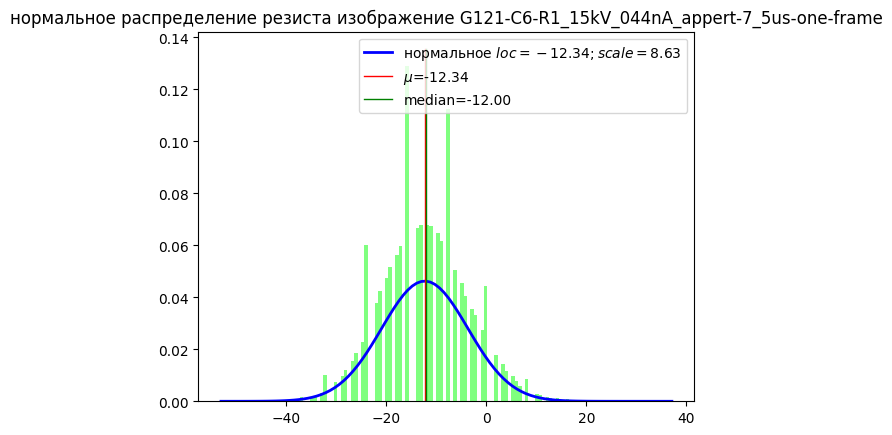

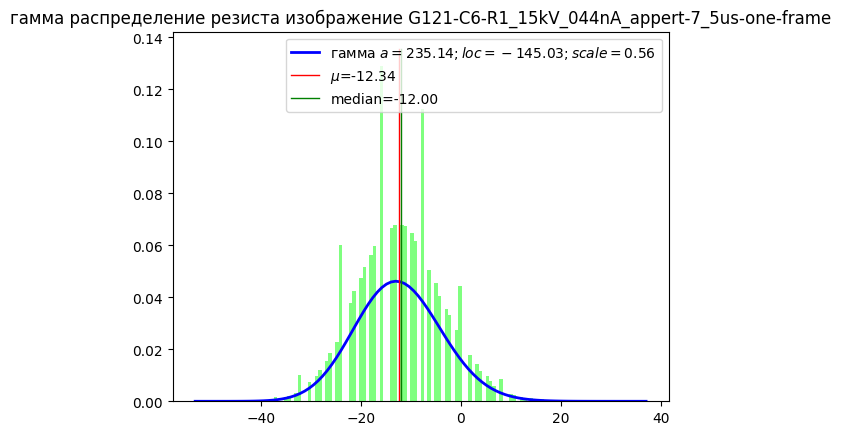

In [53]:
mode_dwell_5 = stats.mode(img_raw_dwell_5.ravel())[0]
# noise_si_crop = img_raw_dwell_si - mode_dwell
noise_phr_crop_5 = img_raw_dwell_phr_5 - mode_dwell_5


# params_norm_si_crop = check_distr(noise_si_crop, 'norm', 'Si', name[:-4], color='red', bins=50)
# params_gamma_si_crop = check_distr(noise_si_crop, 'gamma', 'Si', name[:-4], color='red', bins=50)

params_norm_phr_crop_5 = check_distr(noise_phr_crop_5, 'norm', 'PhR', name[:-4], color='lime', bins=120)
params_gamma_phr_crop_5 = check_distr(noise_phr_crop_5, 'gamma', 'PhR', name[:-4], color='lime', bins=120)

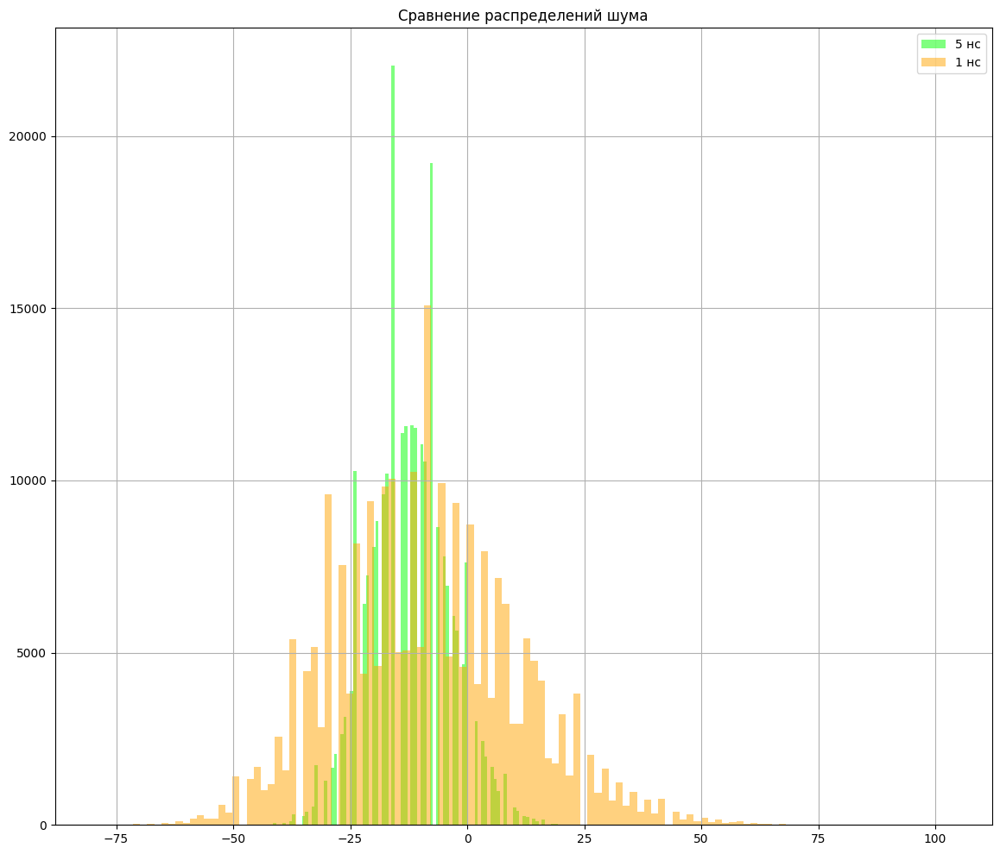

In [54]:
fig, ax = plt.subplots(1,1, figsize=(14, 12))

ax.hist(noise_phr_crop_5.ravel(), alpha=0.5, color='lime', bins=120, label='5 нс')
ax.hist(noise_phr_crop.ravel(), bins=120, alpha=0.5, color='orange', label='1 нс')
plt.title('Сравнение распределений шума')
plt.grid()
plt.legend()
plt.show()

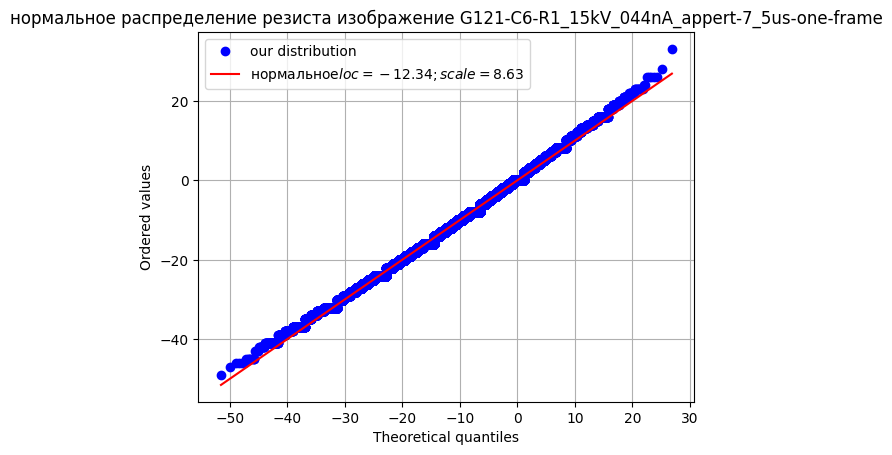

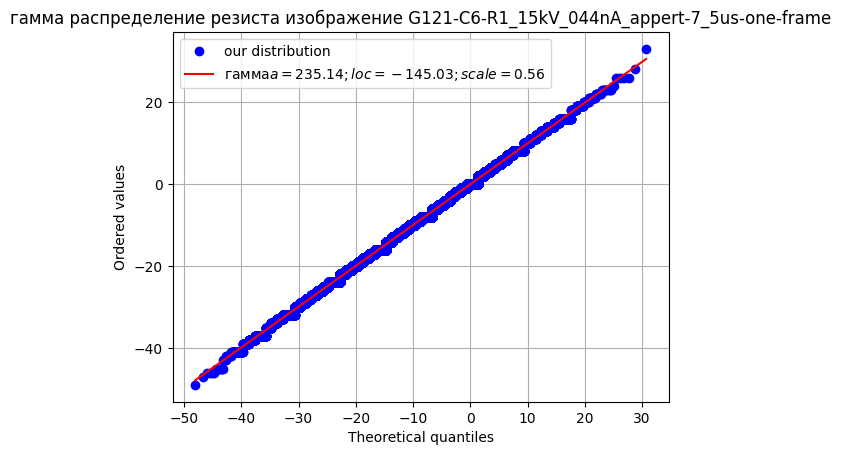

In [55]:
qq_plot(noise_phr_crop_5, name[:-4], 'PhR', 'norm', params_norm_phr_crop_5)
qq_plot(noise_phr_crop_5, name[:-4], 'PhR', 'gamma', params_gamma_phr_crop_5)

In [56]:
name

'G121-C6-R1_15kV_044nA_appert-7_5us-one-frame.tif'

In [45]:
from scipy.stats import shapiro
y = 0
for i in range(5, 9):
    y = y + 100
    data = noise_phr_crop_5[y, :]
    _, p_value_shapiro = np.round(shapiro(data), 4)
    result = stats.anderson(data)
    p_value_anderson = np.round(result.statistic, 4)

    if result.statistic > result.critical_values[-1]:
        res_anderson = "не нормальное"
    else:
       res_anderson = "нормальное"

    kstest_result = stats.kstest(data, 'gamma', args=(params_gamma_phr_crop_5[0], params_gamma_phr_crop_5[2]))
    p_value_kolomogorov = np.round(kstest_result.pvalue, 4)
    if kstest_result.pvalue > 0.05:
        res_kolm = "гамма"
    else:
        res_kolm = "не гамма"
    df_p_values.loc[i] = [name[:-4], y, p_value_shapiro, p_value_anderson, p_value_kolomogorov, res_anderson, res_kolm]

NameError: name 'noise_phr_crop_5' is not defined

In [77]:
from scipy.stats import shapiro
data = noise_phr_crop[400, :1000]
_, p_value = shapiro(data)

if p_value > 0.05:
    print(f'p value = {p_value}\nДанные можно считать нормально распределенными')
else:
    print(f'p value = {p_value}\nДанные нельзя считать нормально распределенными')

p value = 0.4000735878944397
Данные можно считать нормально распределенными


In [62]:
df_p_values

,image,slice y,shapiro p value norm,anderson p value norm,kolmogorov p value gamma,result anderson,result kolmogorov
0,G121-C6-R1_15kV_044nA_appert-7_1us-one-frame,100,0.0110,1.1423,0.0,не нормальное,не гамма
1,G121-C6-R1_15kV_044nA_appert-7_1us-one-frame,200,0.2665,0.4350,0.0,нормальное,не гамма
2,G121-C6-R1_15kV_044nA_appert-7_1us-one-frame,300,0.0001,1.5530,0.0,не нормальное,не гамма
3,G121-C6-R1_15kV_044nA_appert-7_1us-one-frame,400,0.0918,0.5361,0.0,нормальное,не гамма
5,G121-C6-R1_15kV_044nA_appert-7_5us-one-frame,100,0.0583,1.0143,0.0,нормальное,не гамма
6,G121-C6-R1_15kV_044nA_appert-7_5us-one-frame,200,0.0172,1.1849,0.0,не нормальное,не гамма
7,G121-C6-R1_15kV_044nA_appert-7_5us-one-frame,300,0.1848,0.7632,0.0,нормальное,не гамма
8,G121-C6-R1_15kV_044nA_appert-7_5us-one-frame,400,0.0415,0.8507,0.0,нормальное,не гамма


## Inegration

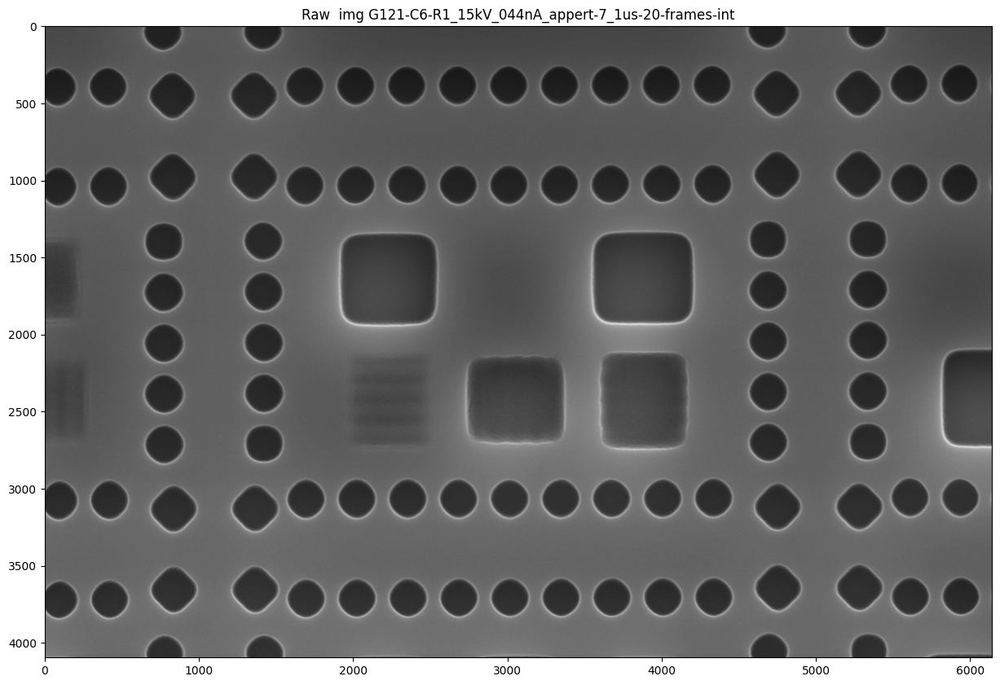

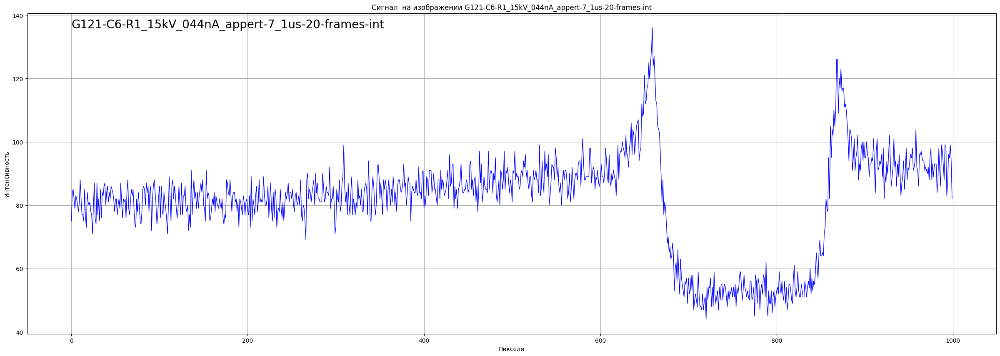

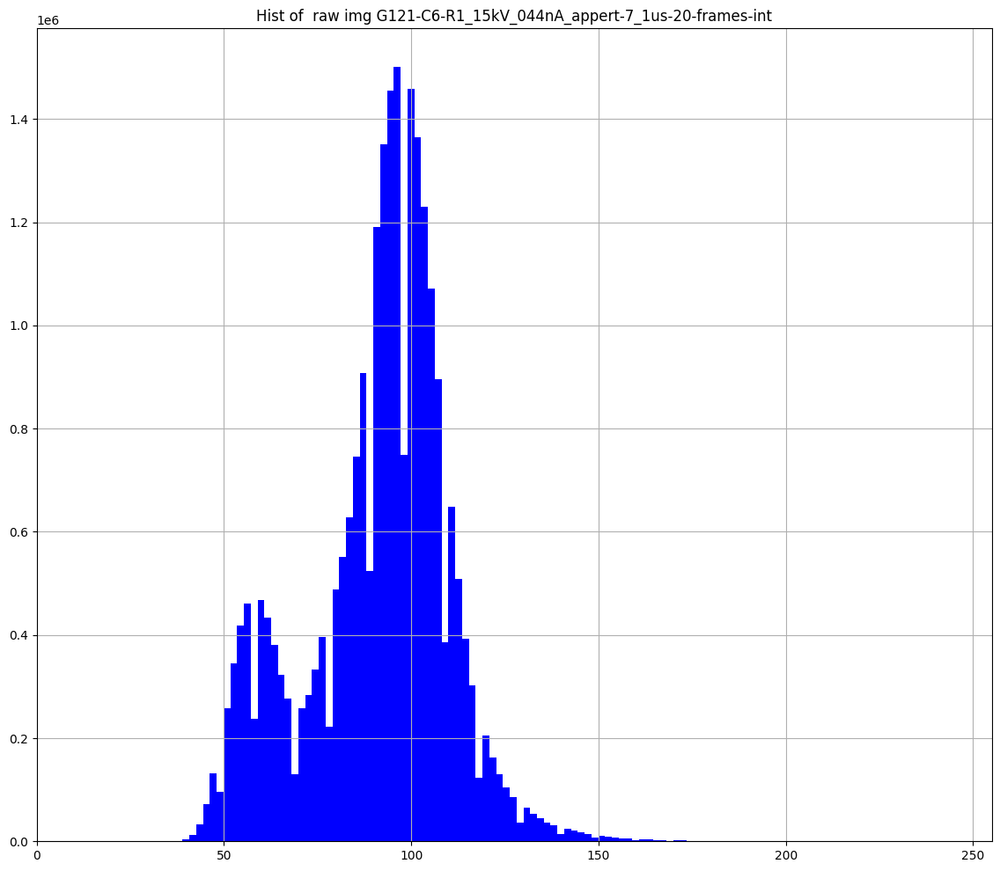

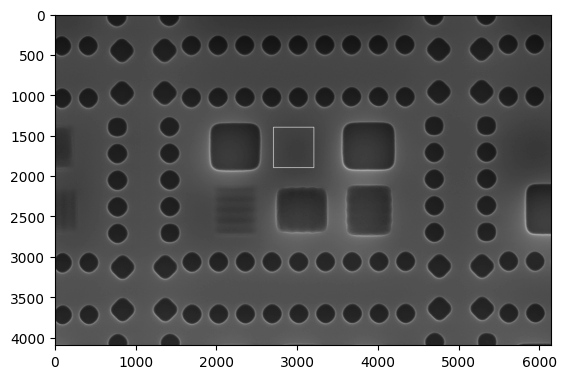

In [79]:
index = 0
name = filenames_inegration[index]
img_raw_inegration_20 = cv2.imread(os.path.join(inegration_dir, name),0).astype(np.float32)

img_raw_inegration_20 = img_raw_inegration_20[:4096,:]

show_imgs(img_raw_inegration_20, None, None, name[:-4], '')

plot_rawden_signals(img_raw_inegration_20, None, name[:-4], '', color='blue')

plot_hists(img_raw_inegration_20, None, None, 100, name[:-4], '', color='blue')

mode_inegration_20 = stats.mode(img_raw_inegration_20.ravel())[0]
noise_inegration_20 = img_raw_inegration_20 - mode_inegration_20

img = img_raw_inegration_20.copy()
img = cv2.rectangle(img, (2700,1400), (3200, 1900), (255, 0, 0), thickness=5)
plt.imshow(img, cmap='gray')

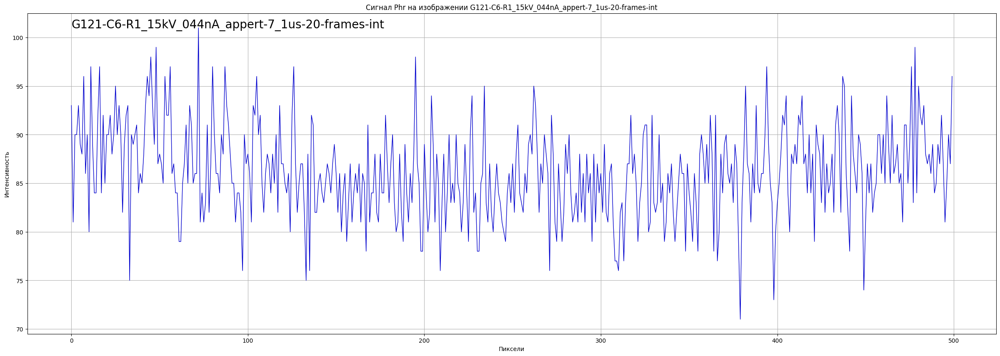

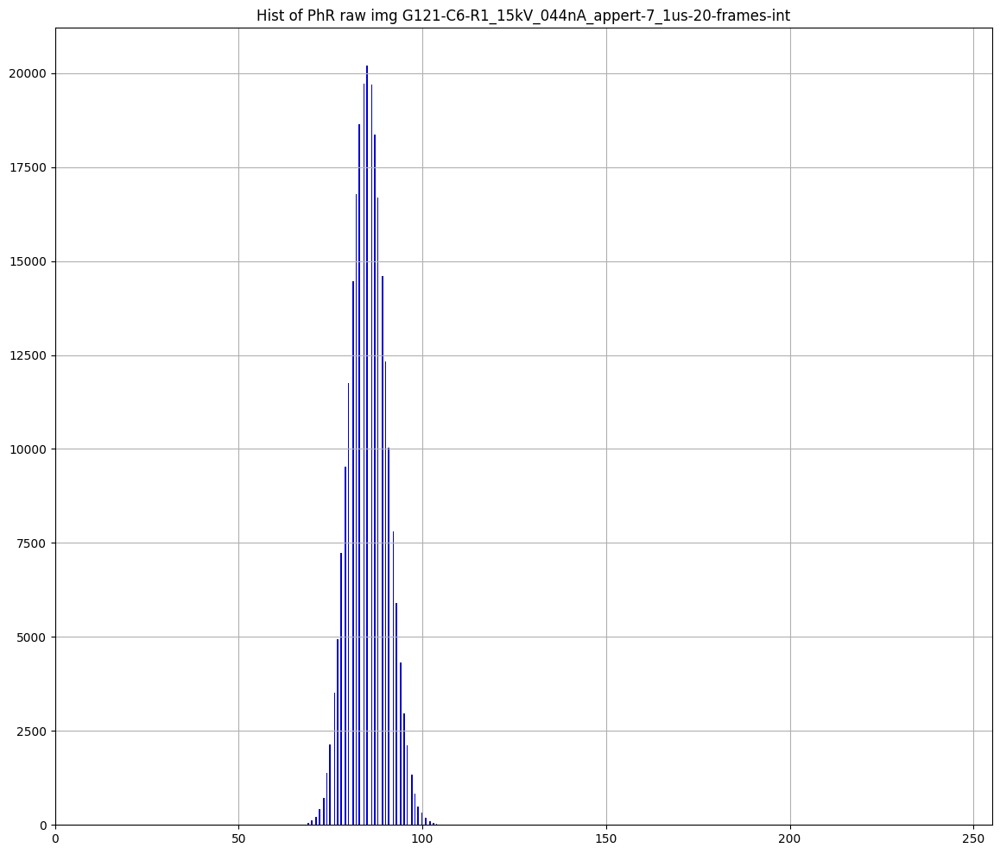

In [70]:
img_raw_inegration_phr_20 = img_raw_inegration_20[1400:1900:,2700:3200]

# plot phr signals
plot_rawden_signals(img_raw_inegration_phr_20, None, name[:-4], 'Phr', color='mediumblue')
plot_hists(img_raw_inegration_phr_20, None, None, 100, name[:-4], 'PhR', color='mediumblue')

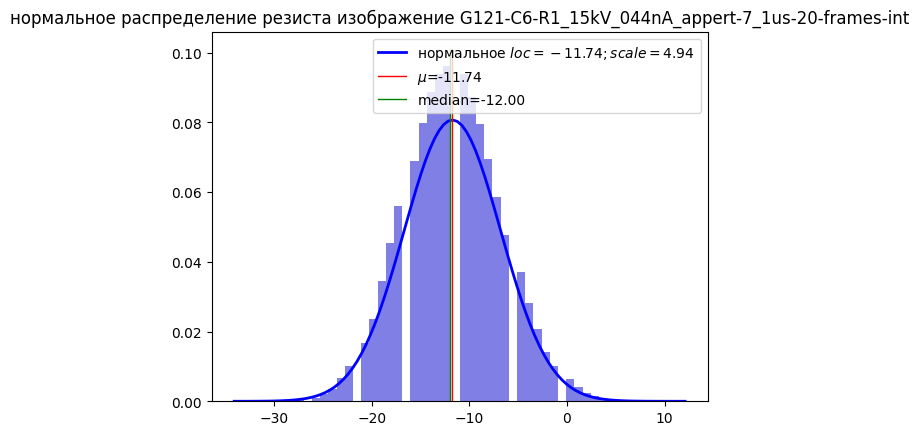

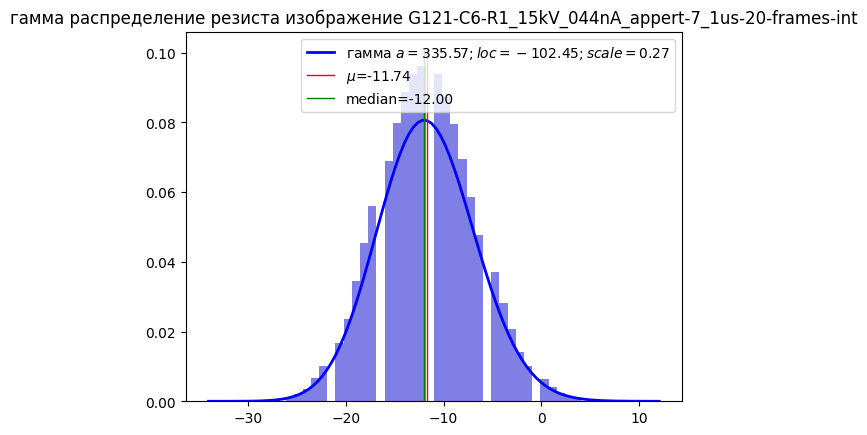

In [80]:
noise_phr_crop_20 = img_raw_inegration_phr_20 - mode_inegration_20

params_norm_phr_crop_20 = check_distr(noise_phr_crop_20, 'norm', 'PhR', name[:-4], color='mediumblue', bins=50)
params_gamma_phr_crop_20 = check_distr(noise_phr_crop_20, 'gamma', 'PhR', name[:-4], color='mediumblue', bins=50)

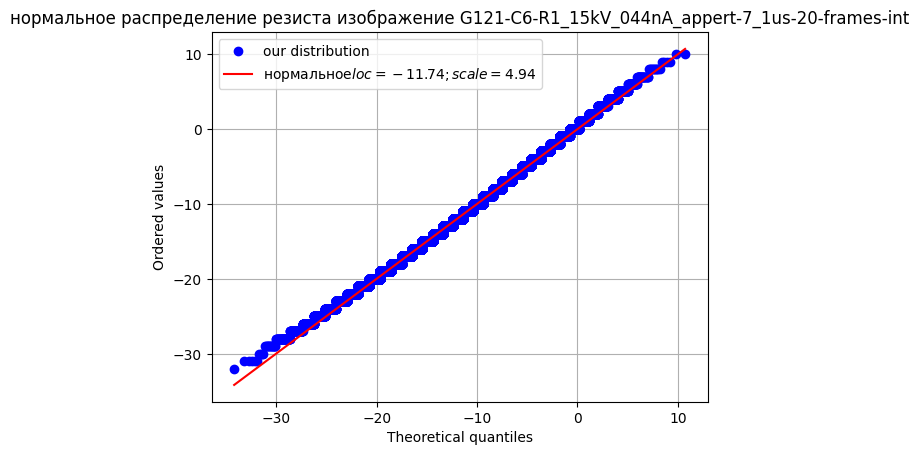

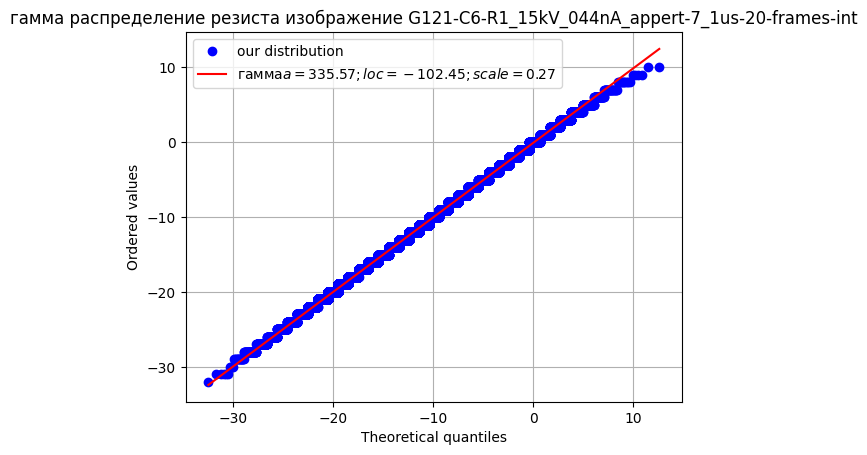

In [66]:
qq_plot(noise_phr_crop, name[:-4], 'PhR', 'norm', params_norm_phr_crop)
qq_plot(noise_phr_crop, name[:-4], 'PhR', 'gamma', params_gamma_phr_crop)

In [36]:
df_noise_char[29:]

,name dataset,name img,shape,mean img,std img,a gamma,loc gamma,scale gamma,brightness,psnr,mse,contrast img,difference gamma,std PhR,mean PhR,brightness name,noise intensity
29,2023-09-25 inegration,G121-C6-R1_15kV_044nA_appert-7_1us-20-frames-int,"(4096, 6144)",91.150299,18.948700,335.5736,-102.4477,0.2704,91.150299,26.0295,162.231400,0.7647,5.5771,4.9448,-11.7380,темное,средний уровень шума
30,2023-09-25 inegration,G121-C6-R1_15kV_044nA_appert-7_300ns-10-frames...,"(4096, 6144)",91.111801,21.470400,156.4345,-146.7080,0.8736,91.111801,24.6824,221.227600,0.8952,12.3230,10.9529,-10.0629,темное,средний уровень шума
31,2023-09-25 inegration,G121-C6-R1_15kV_044nA_appert-7_300ns-8-frames-int,"(4096, 6144)",90.564598,22.019699,125.2427,-145.5840,1.0875,90.564598,24.3995,236.120193,0.9012,13.7395,12.1788,-9.3701,темное,средний уровень шума
32,2023-09-25 inegration,G121-C6-R1_15kV_044nA_appert-7_50ns-20-frames-int,"(4096, 6144)",90.150398,21.839701,153.3869,-150.0434,0.9186,90.150398,24.8370,213.491196,0.8947,12.8226,11.3741,-9.1718,темное,средний уровень шума


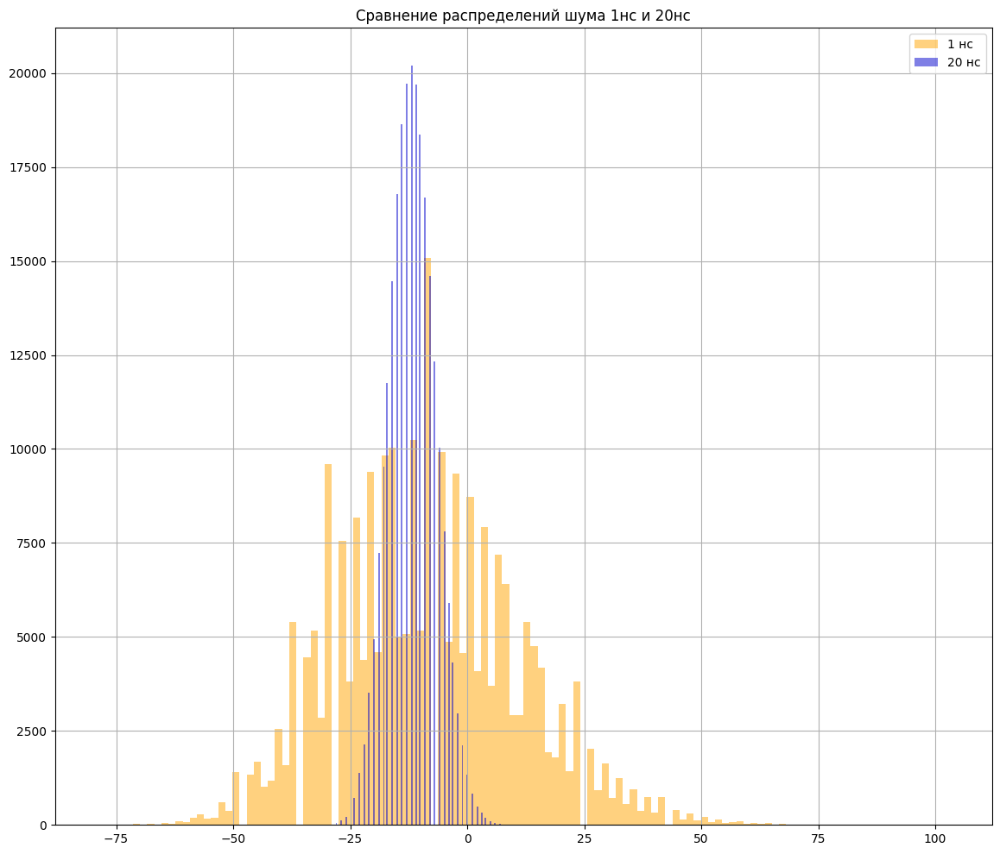

In [77]:
fig, ax = plt.subplots(1,1, figsize=(14, 12))

ax.hist(noise_phr_crop.ravel(), alpha=0.5, color='orange', bins=120, label='1 нс')
ax.hist(noise_phr_crop_20.ravel(), bins=120, alpha=0.5, color='mediumblue', label='20 нс')
plt.title('Сравнение распределений шума 1нс и 20нс')
plt.grid()
plt.legend()
plt.show()

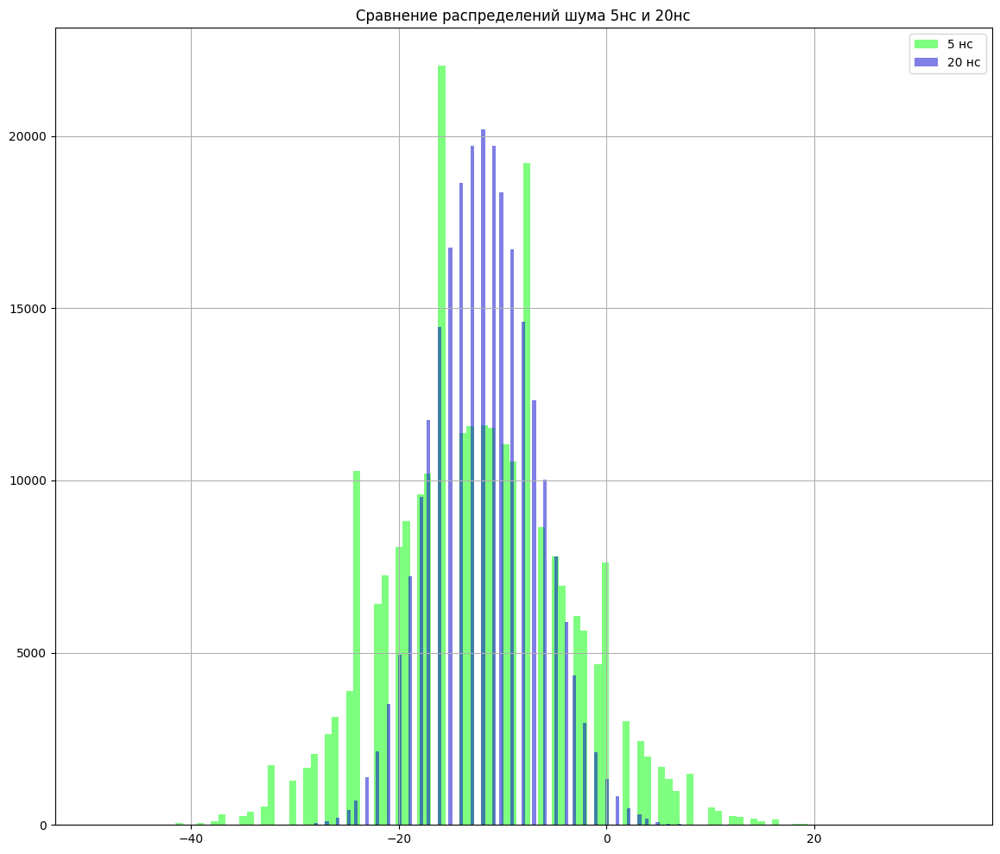

In [78]:
fig, ax = plt.subplots(1,1, figsize=(14, 12))

ax.hist(noise_phr_crop_5.ravel(), alpha=0.5, color='lime', bins=120, label='5 нс')
ax.hist(noise_phr_crop_20.ravel(), bins=120, alpha=0.5, color='mediumblue', label='20 нс')
plt.title('Сравнение распределений шума 5нс и 20нс')
plt.grid()
plt.legend()
plt.show()

In [88]:
df_p_values[8:13]

,image,slice y,shapiro p value norm,anderson p value norm,kolmogorov p value gamma,result anderson,result kolmogorov
9,G121-C6-R1_15kV_044nA_appert-7_1us-20-frames-int,100,0.0228,1.3862,0.0,не нормальное,не гамма
10,G121-C6-R1_15kV_044nA_appert-7_1us-20-frames-int,200,0.0093,1.3474,0.0,не нормальное,не гамма
11,G121-C6-R1_15kV_044nA_appert-7_1us-20-frames-int,300,0.0059,1.4258,0.0,не нормальное,не гамма
12,G121-C6-R1_15kV_044nA_appert-7_1us-20-frames-int,400,0.0006,2.2219,0.0,не нормальное,не гамма


In [85]:
from scipy.stats import shapiro
y = 0
for i in range(9, 13):
    y = y + 100
    data = noise_phr_crop_20[y, :]
    _, p_value_shapiro = np.round(shapiro(data), 4)
    result = stats.anderson(data)
    p_value_anderson = np.round(result.statistic, 4)

    if result.statistic > result.critical_values[-1]:
        res_anderson = "не нормальное"
    else:
       res_anderson = "нормальное"

    if kstest_result.pvalue > 0.05:
        res_kolm = "гамма"
    else:
        res_kolm = "не гамма"

    kstest_result = stats.kstest(data, 'gamma', args=(params_gamma_phr_crop_20[0], params_gamma_phr_crop_20[2]))
    p_value_kolomogorov = np.round(kstest_result.pvalue, 4)
    df_p_values.loc[i] = [name[:-4], y, p_value_shapiro, p_value_anderson, p_value_kolomogorov, res_anderson, res_kolm]

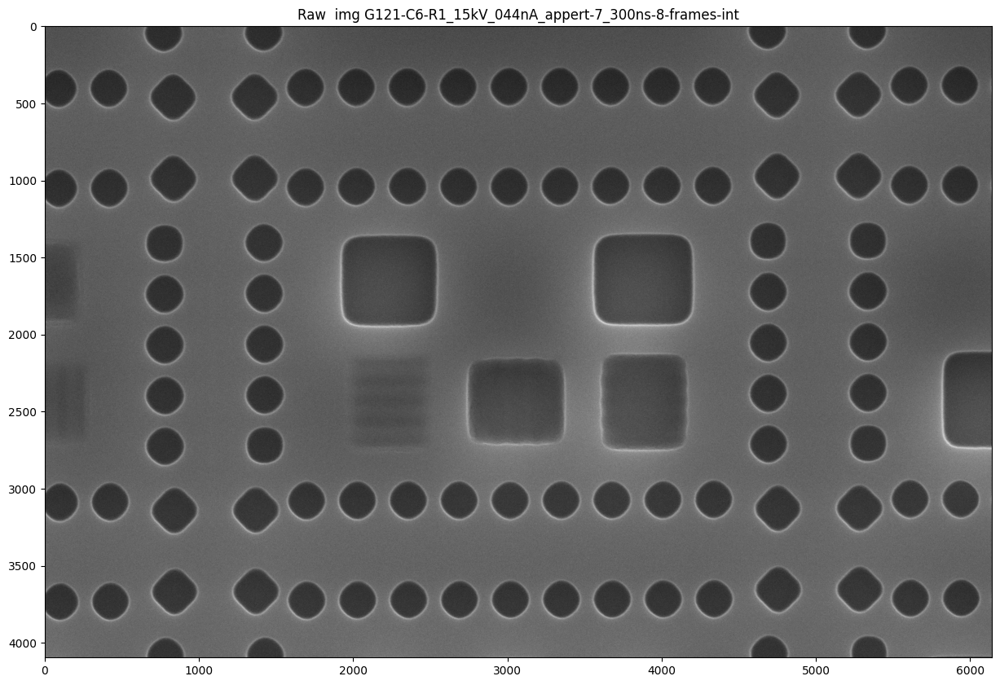

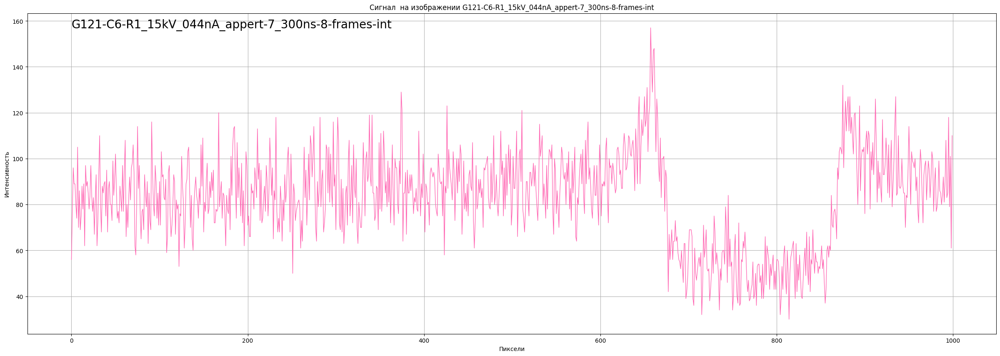

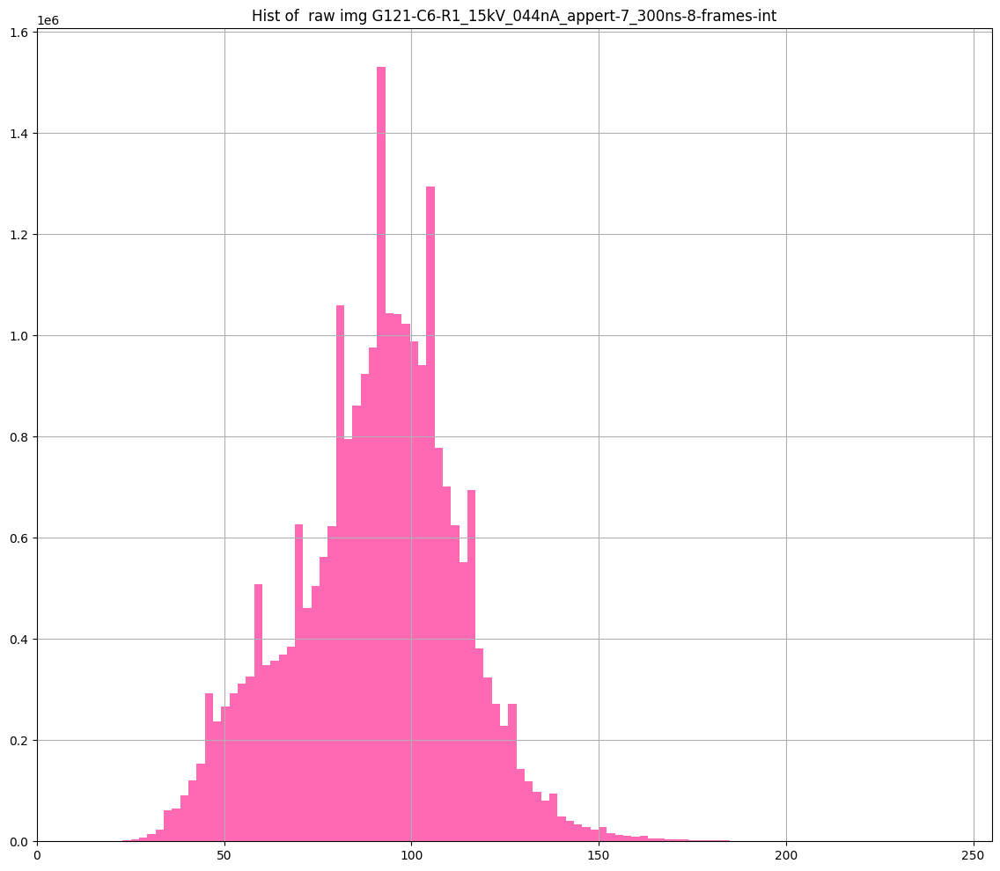

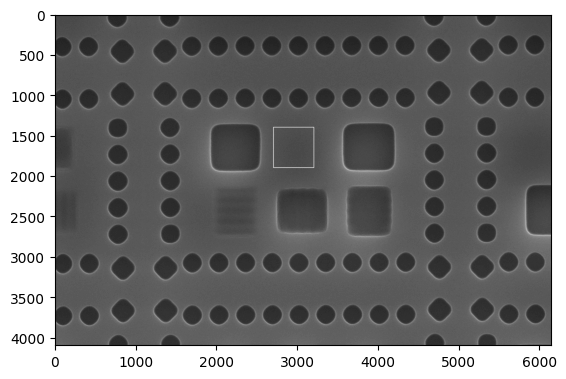

In [29]:
index = 2
name = filenames_inegration[index]
img_raw_inegration_300 = cv2.imread(os.path.join(inegration_dir, name),0).astype(np.float32)

img_raw_inegration_300 = img_raw_inegration_300[:4096,:]

show_imgs(img_raw_inegration_300, None, None, name[:-4], '')

plot_rawden_signals(img_raw_inegration_300, None, name[:-4], '', color='hotpink')

plot_hists(img_raw_inegration_300, None, None, 100, name[:-4], '', color='hotpink')

mode_inegration_300 = stats.mode(img_raw_inegration_300.ravel())[0]
noise_inegration_300 = img_raw_inegration_300 - mode_inegration_300

img = img_raw_inegration_300.copy()
img = cv2.rectangle(img, (2700,1400), (3200, 1900), (255, 0, 0), thickness=5)
plt.imshow(img, cmap='gray')

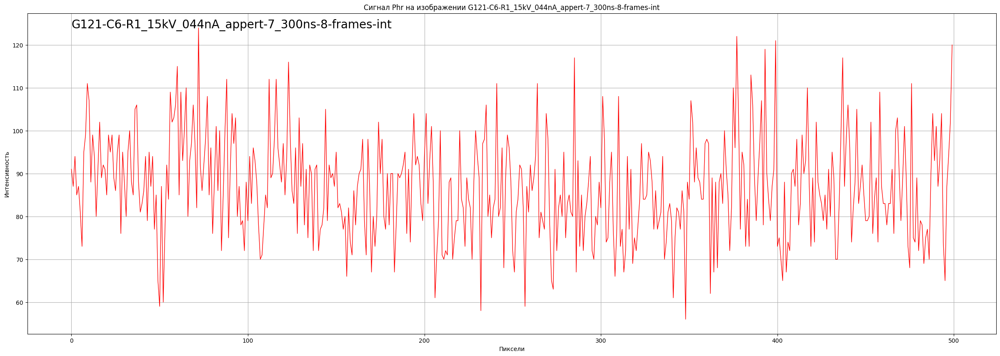

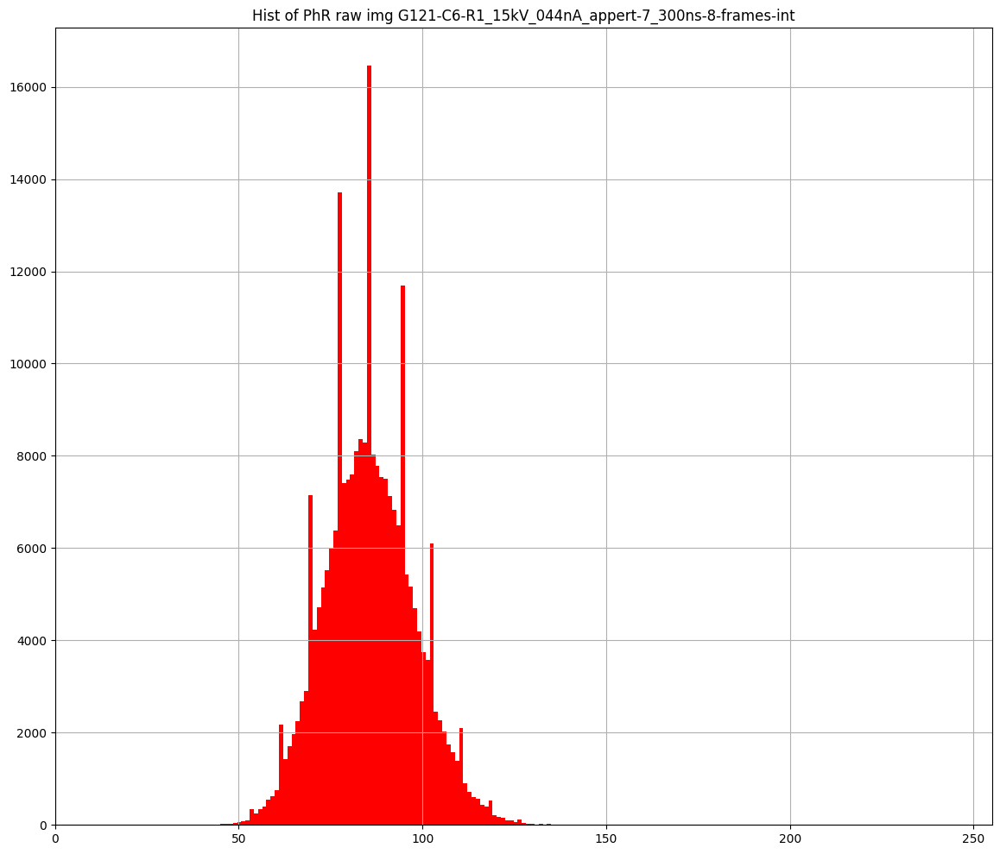

In [30]:
img_raw_inegration_phr_300 = img_raw_inegration_300[1400:1900:,2700:3200]

# plot phr signals
plot_rawden_signals(img_raw_inegration_phr_300, None, name[:-4], 'Phr', color='red')
plot_hists(img_raw_inegration_phr_300, None, None, 100, name[:-4], 'PhR', color='red')

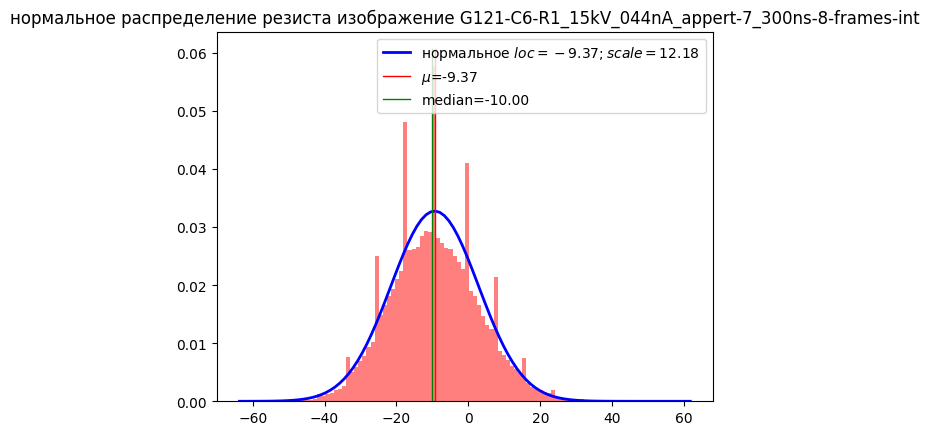

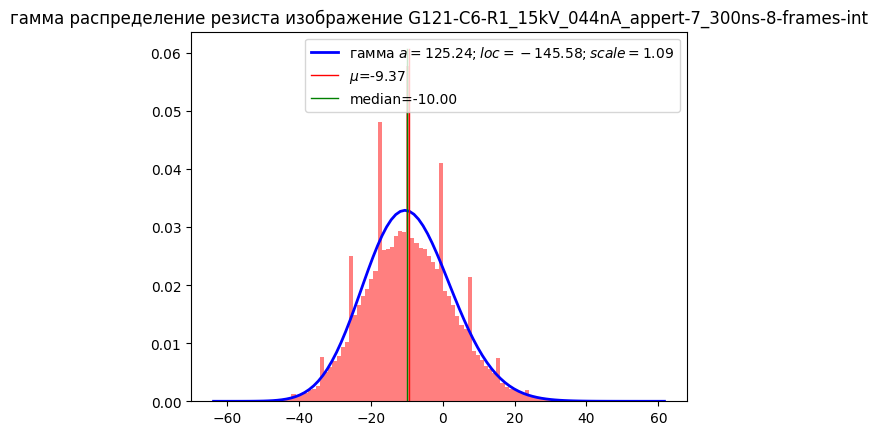

In [31]:
noise_phr_crop_300 = img_raw_inegration_phr_300 - mode_inegration_300

params_norm_phr_crop_300 = check_distr(noise_phr_crop_300, 'norm', 'PhR', name[:-4], color='red', bins=100)
params_gamma_phr_crop_300 = check_distr(noise_phr_crop_300, 'gamma', 'PhR', name[:-4], color='red', bins=100)

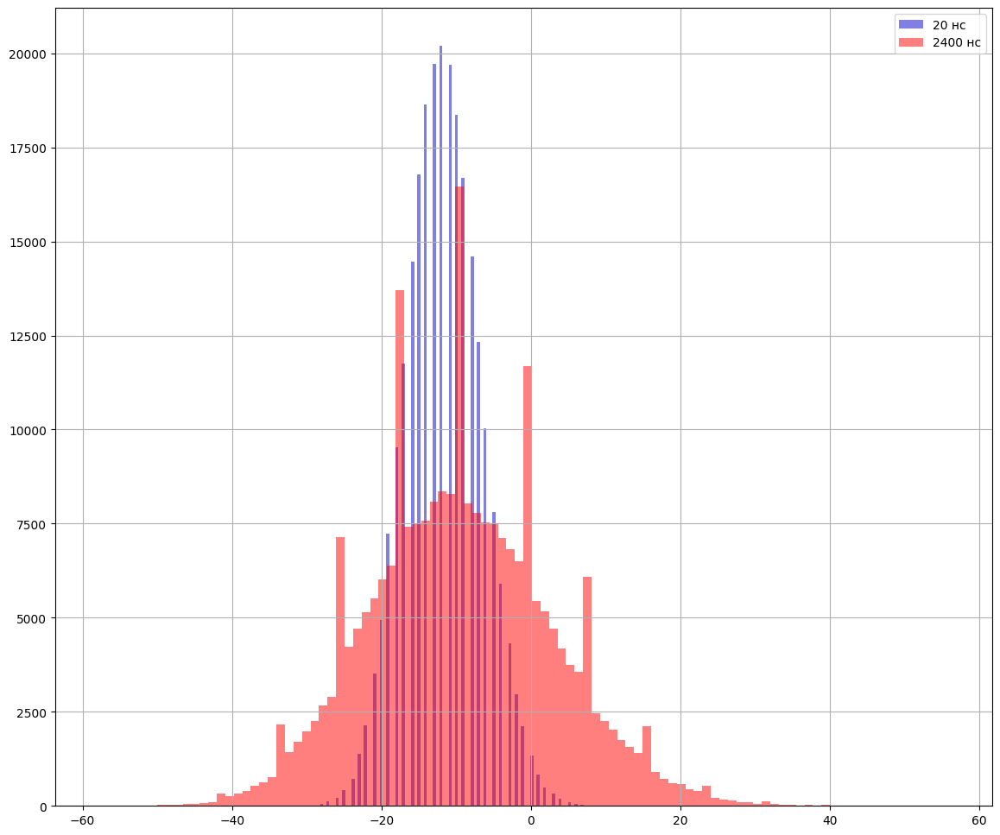

In [38]:
fig, ax = plt.subplots(1,1, figsize=(14, 12))

ax.hist(noise_phr_crop.ravel(), alpha=0.5, color='mediumblue', bins=100, label='20 нс')
ax.hist(noise_phr_crop_300.ravel(), bins=100, alpha=0.5, color='red', label='2400 нс')
plt.grid()
plt.legend()
plt.show()

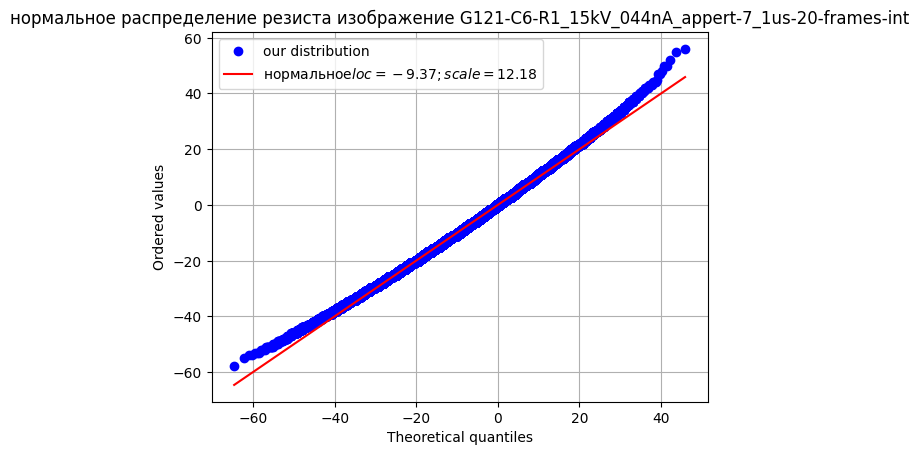

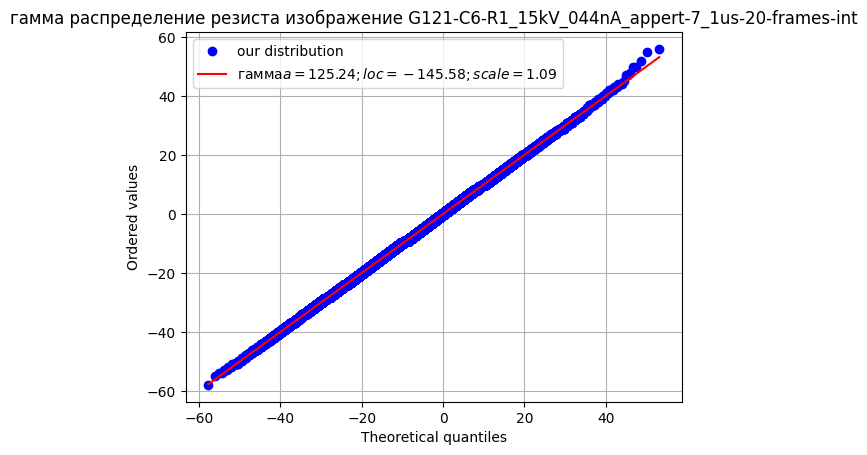

In [39]:
qq_plot(noise_phr_crop_300, name[:-4], 'PhR', 'norm', params_norm_phr_crop_300)
qq_plot(noise_phr_crop_300, name[:-4], 'PhR', 'gamma', params_gamma_phr_crop_300)

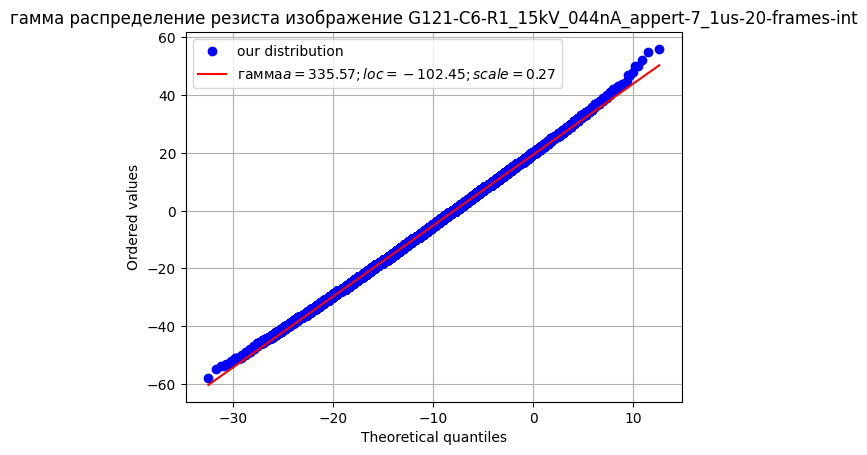

In [40]:
qq_plot(noise_phr_crop_300, name[:-4], 'PhR', 'gamma', params_gamma_phr_crop)

In [47]:
from scipy.stats import shapiro
data = noise_phr_crop[400, :1000]
_, p_value = shapiro(data)

if p_value > 0.05:
    print(f'p value = {p_value}\nДанные можно считать нормально распределенными')
else:
    print(f'p value = {p_value}\nДанные нельзя считать нормально распределенными')

p value = 0.0005834205076098442
Данные нельзя считать нормально распределенными


In [44]:
p_value

0.0005834205076098442

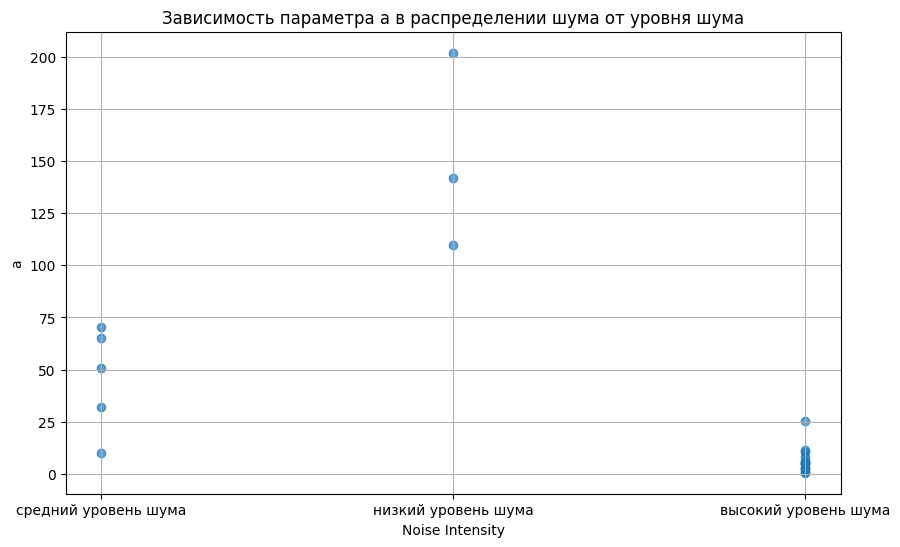

In [92]:
df = df_noise_char.drop([22, 23])
a_column = df['a gamma']
noise_intensity_column = df['noise intensity']

plt.figure(figsize=(10, 6))
plt.scatter(noise_intensity_column, a_column, alpha=0.7)
plt.title('Зависимость параметра a в распределении шума от уровня шума')
plt.xlabel('Noise Intensity')
plt.ylabel('a')
plt.grid(True)
plt.show()

In [99]:
df = df_noise_char.drop([22, 23])

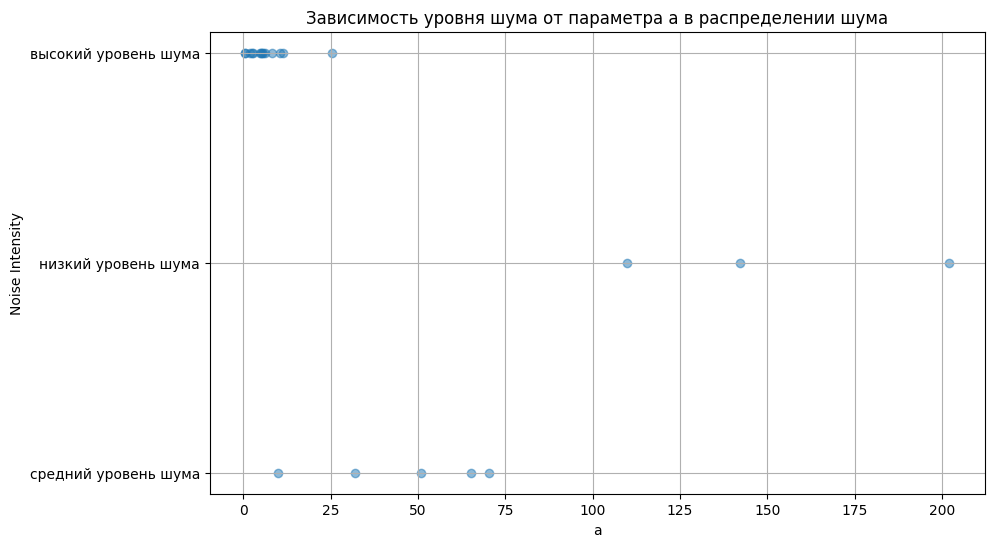

In [94]:
df = df_noise_char.drop([22, 23])
a_column = df['a gamma']
noise_intensity_column = df['noise intensity']

plt.figure(figsize=(10, 6))
plt.scatter(a_column, noise_intensity_column, alpha=0.5)
plt.title('Зависимость уровня шума от параметра a в распределении шума')
plt.ylabel('Noise Intensity')
plt.xlabel('a')
plt.grid(True)
plt.show()

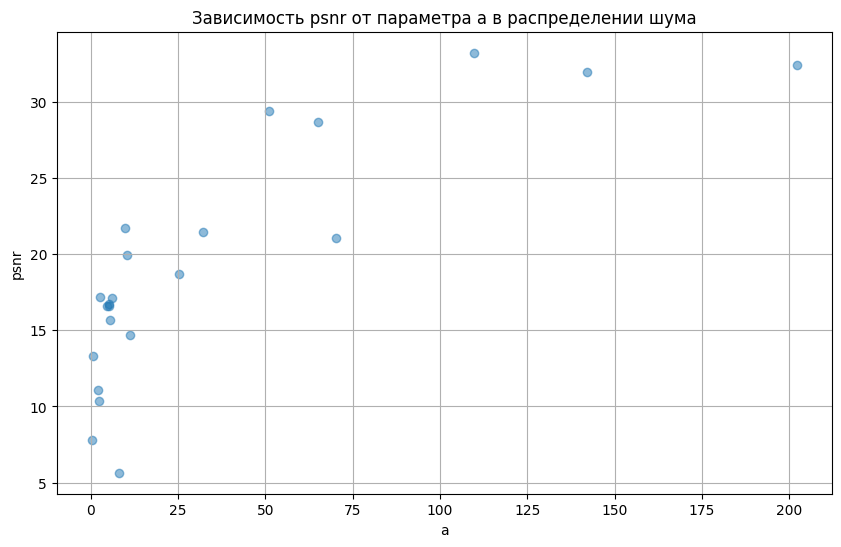

In [103]:
df = df_noise_char.drop([22, 23])
a_column = df['a gamma']
noise_intensity_column = df['psnr']

plt.figure(figsize=(10, 6))
plt.scatter(a_column, noise_intensity_column, alpha=0.5)
plt.title('Зависимость psnr от параметра a в распределении шума')
plt.ylabel('psnr')
plt.xlabel('a')
plt.grid(True)
plt.show()

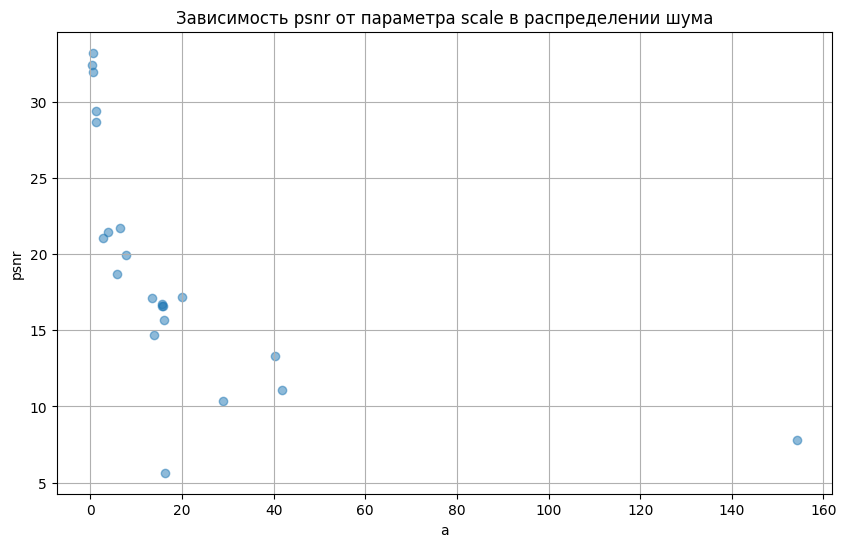

In [106]:
df = df_noise_char.drop([22, 23])
scale_column = df['scale gamma']
noise_intensity_column = df['psnr']

plt.figure(figsize=(10, 6))
plt.scatter(scale_column, noise_intensity_column, alpha=0.5)
plt.title('Зависимость psnr от параметра scale в распределении шума')
plt.ylabel('psnr')
plt.xlabel('a')
plt.grid(True)
plt.show()

In [61]:
# import seaborn as sns
# sns.boxplot(x='noise intensity', y='a', data=df_noise_char)
# plt.xlabel('Уровень шума')
# plt.ylabel('Значение столбца "a"')
# plt.title('Ящик с усами для "a" по уровню шума')
# plt.xticks(rotation=45)
# plt.show()

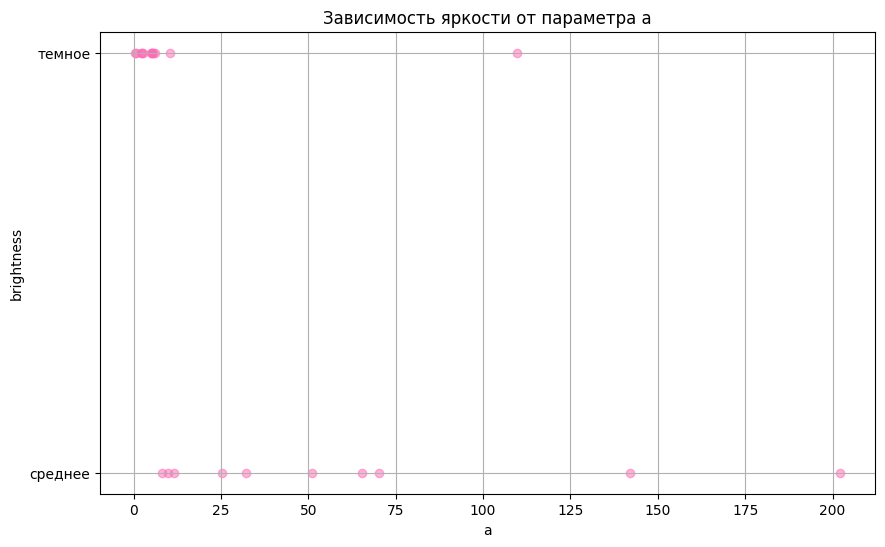

In [100]:
a_column = df['a gamma']
noise_intensity_column = df['brightness name']

plt.figure(figsize=(10, 6))
plt.scatter(a_column, noise_intensity_column, alpha=0.5, color='hotpink')
plt.title('Зависимость яркости от параметра a')
plt.xlabel('a')
plt.ylabel('brightness')
plt.grid(True)
plt.show()

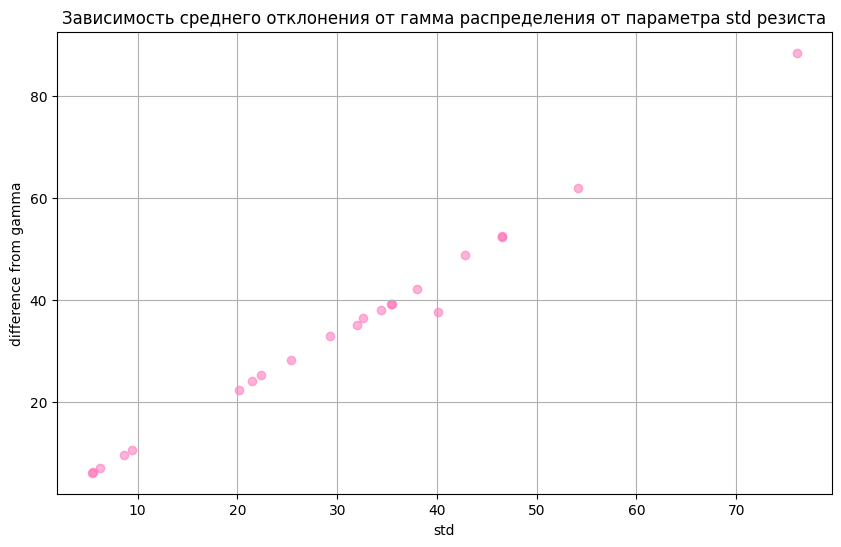

In [117]:
diff_column = df['difference gamma']
std_phr_column = df['std PhR']

plt.figure(figsize=(10, 6))
plt.scatter(std_phr_column, diff_column, alpha=0.5, color='hotpink')
plt.title('Зависимость среднего отклонения от гамма распределения от параметра std резиста')
plt.xlabel('std')
plt.ylabel('difference from gamma')
plt.grid(True)
plt.show()

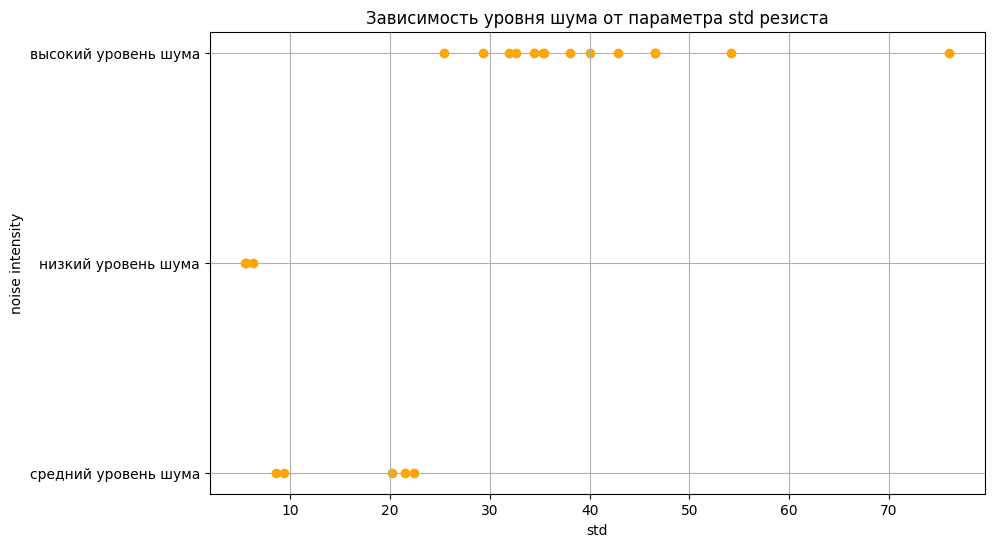

In [122]:
noise_intensity_column = df['noise intensity']
std_phr_column = df['std PhR']

plt.figure(figsize=(10, 6))
plt.scatter(std_phr_column, noise_intensity_column, alpha=1, color='orange')
plt.title('Зависимость уровня шума от параметра std резиста')
plt.xlabel('std')
plt.ylabel('noise intensity')
plt.grid(True)
plt.show()

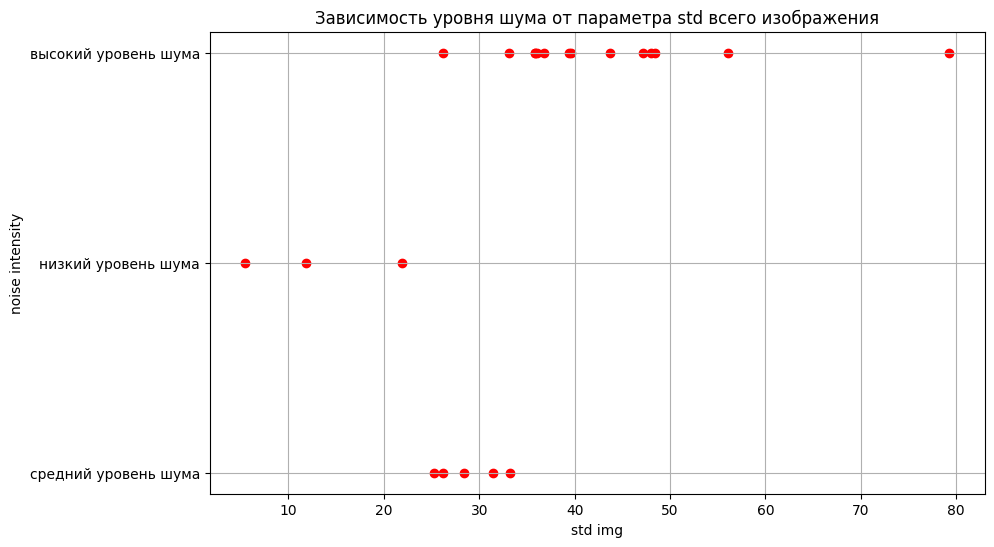

In [121]:
noise_intensity_column = df['noise intensity']
std_img_column = df['std img']

plt.figure(figsize=(10, 6))
plt.scatter(std_img_column, noise_intensity_column, alpha=1, color='red')
plt.title('Зависимость уровня шума от параметра std всего изображения')
plt.xlabel('std img')
plt.ylabel('noise intensity')
plt.grid(True)
plt.show()

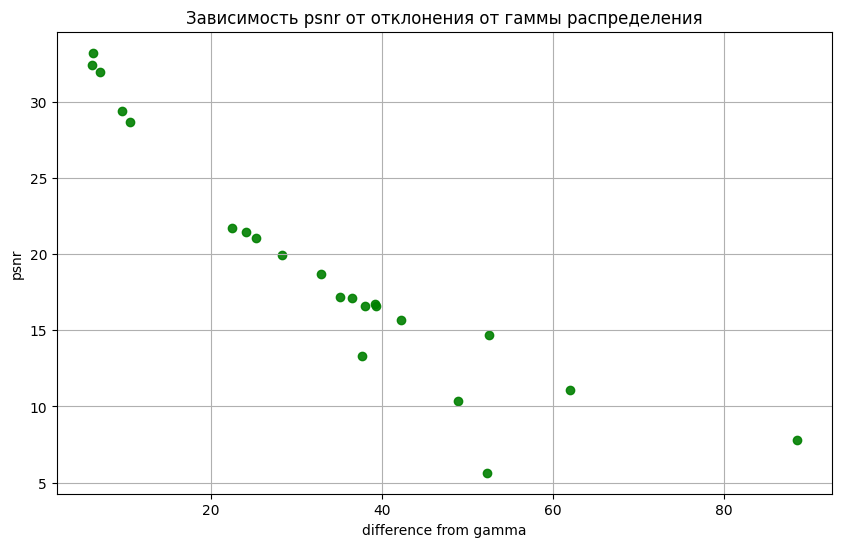

In [115]:
diff_column = df['difference gamma']
psnr_column = df['psnr']

plt.figure(figsize=(10, 6))
plt.scatter(diff_column, psnr_column, alpha=0.9, color='green')
plt.title('Зависимость psnr от отклонения от гаммы распределения')
plt.xlabel('difference from gamma')
plt.ylabel('psnr')
plt.grid(True)
plt.show()

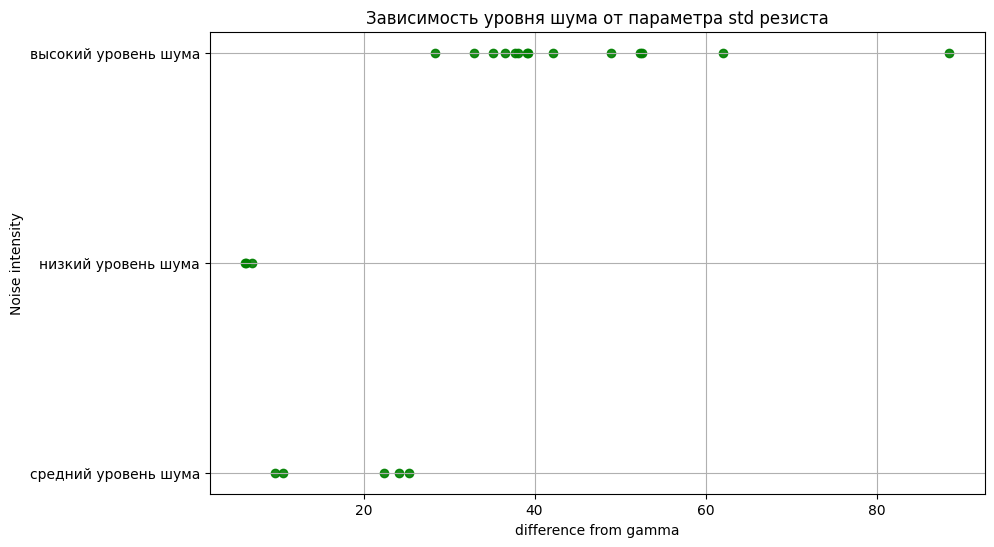

In [118]:
diff_column = df['difference gamma']
noise_intensity_column = df['noise intensity']

plt.figure(figsize=(10, 6))
plt.scatter(diff_column, noise_intensity_column, alpha=0.9, color='green')
plt.title('Зависимость уровня шума от параметра std резиста')
plt.xlabel('difference from gamma')
plt.ylabel('Noise intensity')
plt.grid(True)
plt.show()

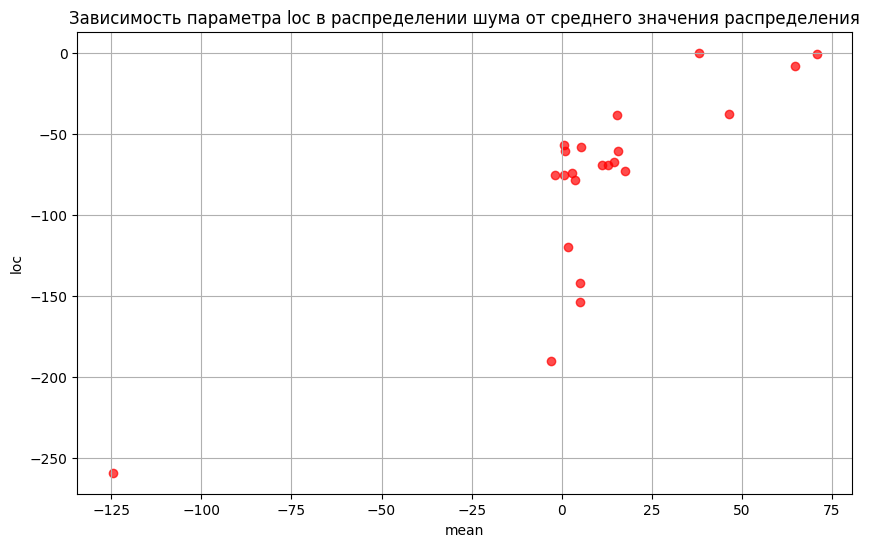

In [102]:
loc_column = df['loc gamma']
mean_column = df['mean PhR']
# noise_intensity_column = df_noise_char['noise intensity']

# Создайте график зависимости
plt.figure(figsize=(10, 6))
plt.scatter(mean_column, loc_column, alpha=0.7, color='red')
plt.title('Зависимость параметра loc в распределении шума от среднего значения распределения')
plt.xlabel('mean')
plt.ylabel('loc')
plt.grid(True)
plt.show()

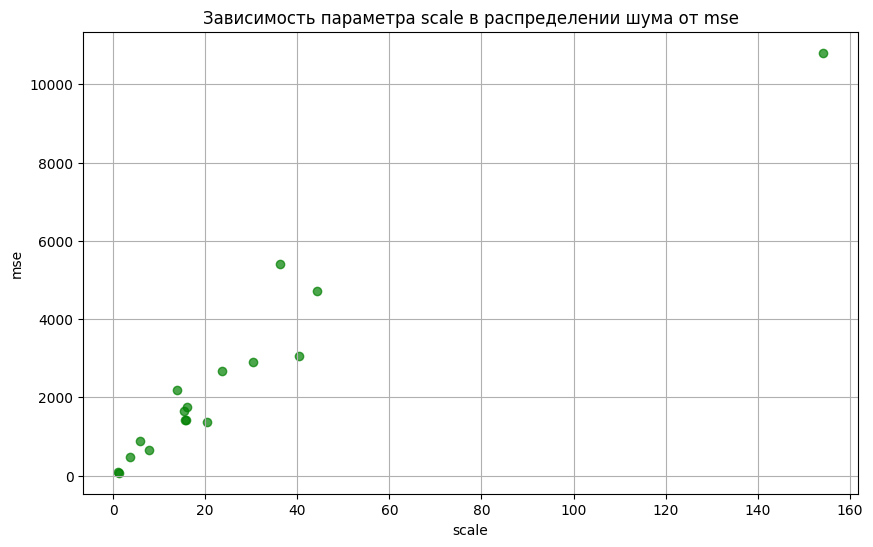

In [58]:
plt.figure(figsize=(10, 6))
# plt.scatter(df_noise_char['scale'], df_noise_char['noise intensity'], alpha=0.7, color='green')
plt.scatter(df_noise_char['scale'], df_noise_char['mse'], alpha=0.7, color='green')

plt.title('Зависимость параметра scale в распределении шума от mse')
plt.xlabel('scale')
plt.ylabel('mse')
plt.grid(True)
plt.show()

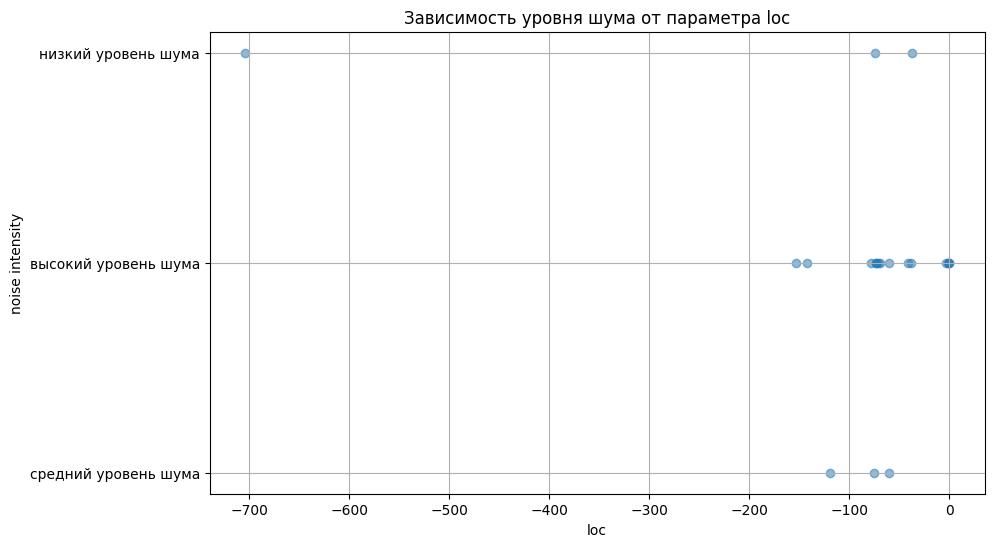

In [ ]:
plt.figure(figsize=(10, 6))
plt.scatter(loc_column, noise_intensity_column, alpha=0.5)
plt.title('Зависимость уровня шума от параметра loc')
plt.xlabel('loc')
plt.ylabel('noise intensity')
plt.grid(True)
plt.show()

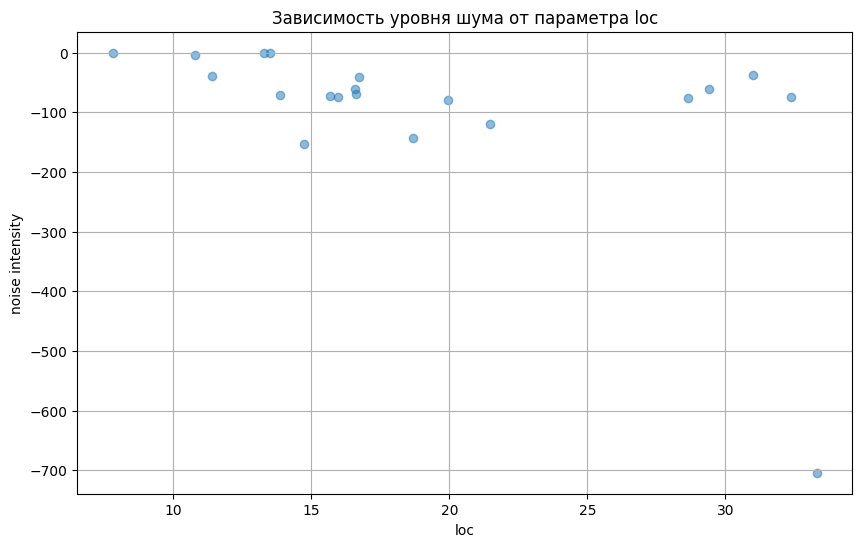

In [ ]:
psnr_column = df_noise_char['psnr']
plt.figure(figsize=(10, 6))
plt.scatter(psnr_column, loc_column, alpha=0.5)
plt.title('Зависимость уровня шума от параметра loc')
plt.xlabel('loc')
plt.ylabel('noise intensity')
plt.grid(True)
plt.show()

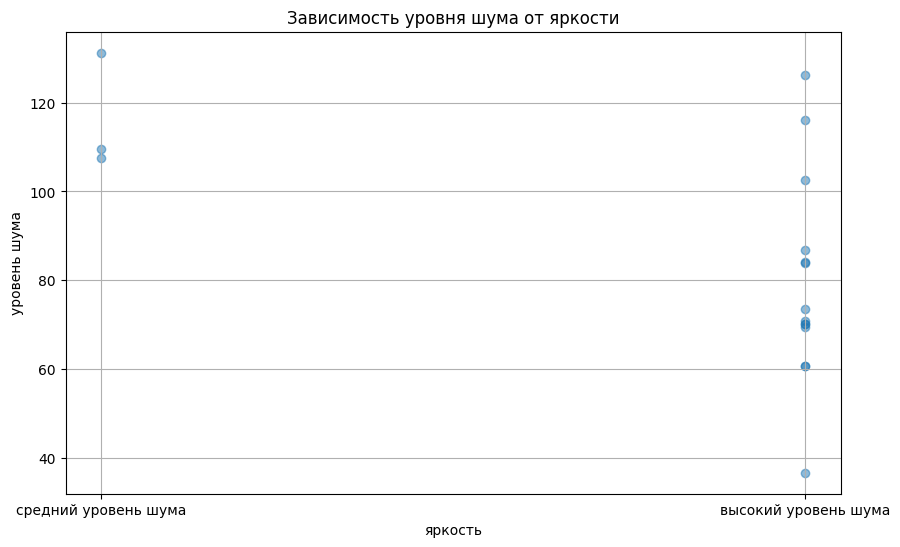

In [ ]:
bright_column = df_noise_char['brightness']
noise_intensity_column = df_noise_char['noise intensity']
# noise_intensity_column = df_noise_char['noise intensity']

# Создайте график зависимости
plt.figure(figsize=(10, 6))
plt.scatter(noise_intensity_column,bright_column, alpha=0.5)
plt.title('Зависимость уровня шума от яркости')
plt.xlabel('яркость')
plt.ylabel('уровень шума')
plt.grid(True)
plt.show()

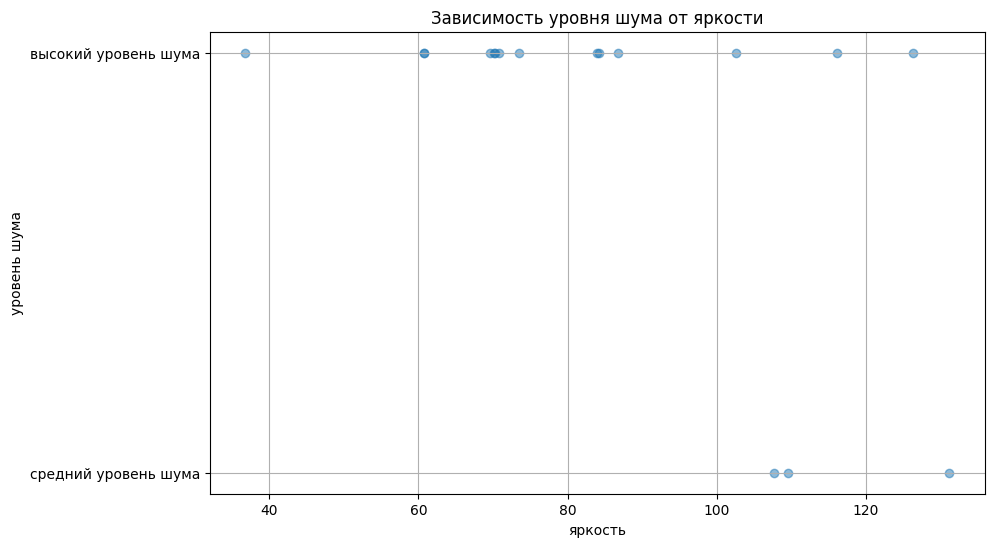

In [ ]:
bright_column = df_noise_char['brightness']
noise_intensity_column = df_noise_char['noise intensity']
# noise_intensity_column = df_noise_char['noise intensity']

# Создайте график зависимости
plt.figure(figsize=(10, 6))
plt.scatter(bright_column, noise_intensity_column,  alpha=0.5)
plt.title('Зависимость уровня шума от яркости')
plt.xlabel('яркость')
plt.ylabel('уровень шума')
plt.grid(True)
plt.show()

In [ ]:
noise_intensity_counts = df_noise_char['noise intensity'].value_counts()
plt.pie(noise_intensity_counts, labels=noise_intensity_counts.index, autopct='%1.1f%%')
plt.title('Круговая диаграмма уровня шума')
plt.show()

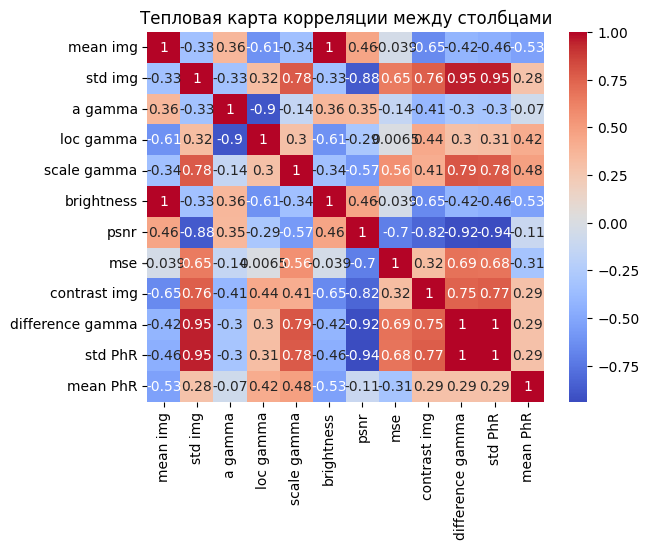

In [98]:
import seaborn as sns
numeric_df = df_noise_char.select_dtypes(include=['number'])
corr_matrix = numeric_df.corr()
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', fmt='.2g')
plt.title('Тепловая карта корреляции между столбцами')
plt.show()

In [39]:
len(df_noise_char.columns)

12